In [1]:
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import numpy as np
import warnings
import shap
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from xgboost import XGBRegressor
from sklearn.preprocessing import OrdinalEncoder, OneHotEncoder
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error,mean_squared_log_error,r2_score,mean_absolute_error
import optuna
warnings.filterwarnings("ignore")

Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)


In [2]:
def read_dataset(file):
    if file.split('.')[1]=='csv':
        df = pd.read_csv(file)
    if file.split('.')[1]=='xlsx':
        df = pd.read_excel(file)
    return df

In [3]:
def missing_control_plot(df):
    df_null = df.isna().sum()
    missing_df = pd.DataFrame(
                  data=[df_null],
                  columns=df.columns,
                  index=["Null Size"]).T.sort_values("Null Size", ascending=False)
    missing_df = missing_df.loc[(missing_df["Null Size"] > 0)]
    #missing_df=missing_df.reset_index().rename(columns={'index':'Columns'})
    fig = px.bar(missing_df,x=missing_df.index, y="Null Size", hover_name='Null Size', 
                 color='Null Size',labels={
                         "index": "Columns",
                         },
                 color_discrete_sequence=['#D81F26'],template='plotly_dark',
                 title="Dataset Null Graph", width=1400, height=700)
    fig.update_layout(barmode='group')
    fig.show()
    return missing_df

In [4]:
def missing_count_plot(df,missing_df,variable_type):
    df_missing = df[missing_df.index]
    if variable_type=='num':
        liste = df_missing.loc[:, df_missing.dtypes != "object"].columns
        template = 'plotly_dark'
    if variable_type=='cat':
        liste = df_missing.loc[:, df_missing.dtypes == "object"].columns
        template = 'ggplot2'
    for i in liste:
        x = df[i].unique()
        y = [df[i][df[i] == j].count() for j in x]
        bar = px.bar(df, x=x, y=y, text=y,labels={
                         "x": i,
                        "y":"count",
                         },
                          color_discrete_sequence=['#D81F26'],color=y,
                          template=template, title="Null Variable Count",
                          width=1000, height=500)
        bar.show()

In [5]:
def corr_plot(df,target):
    corr = df.select_dtypes(exclude = ['object']).iloc[:,1:].corr()
    corr_list = corr[target].sort_values(axis=0,ascending=False).iloc[1:]
    corr_df = pd.DataFrame(corr_list)
    fig = px.bar(corr_df,x=corr_df.index, y=target, hover_name=target, 
                 color=target,labels={
                             "index": "Columns",
                            target:target,
                             },
                 color_discrete_sequence=['#D81F26'],template='plotly_dark',
                 title="Dataset Correlation Graph", width=1400, height=700)
    fig.update_layout(barmode='group')
    fig.show()

In [6]:
def missing_value_fill(data):
    df = data.copy()
    # BsmtFinType2: Quality of second finished area (if present)
    # BsmtFinType1: Quality of basement finished area
    # BsmtQual: Height of the basement
    # Fence: Fence quality
    # FireplaceQu: Fireplace quality
    # MasVnrArea: Masonry veneer area in square feet
    # MasVnrType: Masonry veneer type
    # MiscFeature: Miscellaneous feature not covered in other categories
    # PoolQC: Pool quality
    # LotFrontage: Linear feet of street connected to property
    # Alley: Type of alley access
    # BsmtCond: General condition of the basement
    # BsmtExposure: Walkout or garden level basement walls
    # Electrical: Electrical system
    # GarageType: Garage location
    # GarageFinish: Interior finish of the garage
    # GarageQual: Garage quality
    # GarageCond: Garage condition
    # GarageYrBlt: Year garage was built
    # NH : Not have
    # NB : No Basement
    # NF : No Fence
    # NFP : No Fireplace
    df['BsmtFinType2'] = df['BsmtFinType2'].fillna('NH')
    df['BsmtFinType1'] = df['BsmtFinType1'].fillna('NB')
    df['BsmtQual'] = df['BsmtQual'].fillna('NB')
    df['Fence'] = df['Fence'].fillna('NF')
    df['FireplaceQu'] = df['FireplaceQu'].fillna('NFP')
    # I filled in with 0 as most houses don't have it.
    df['MasVnrArea'] = df['MasVnrArea'].fillna(df['MasVnrArea'].mode()[0])
    # I filled in the empty ones with None since the ones that didn't have the ownership information were labeled as None in the column data.
    df['MasVnrType'] = df['MasVnrType'].fillna('None')
    df['MiscFeature'] = df['MiscFeature'].fillna('NH')
    df['PoolQC'] = df['PoolQC'].fillna('NH')
    # I grouped each house by its own neighborhood and filled in the missing values with the median.
    df['LotFrontage'] = df.groupby('Neighborhood')['LotFrontage'].apply(lambda x : x.fillna(x.median()))
    df['Alley'] = df['Alley'].fillna('NH')
    df['BsmtCond'] = df['BsmtCond'].fillna('NH')
    # I filled in the empty ones with No since the ones that didn't have the ownership information were labeled as No in the column data.
    df['BsmtExposure'] = df['BsmtExposure'].fillna('No')
    # I filled in with the most commonly used system for electrical systems in houses.
    df['Electrical']=df['Electrical'].fillna(train['BsmtExposure'].mode()[0])
    df['GarageType'] = df['GarageType'].fillna('NH')
    df['GarageFinish'] = df['GarageFinish'].fillna('NH')
    df['GarageQual'] = df['GarageQual'].fillna('NH')
    df['GarageCond'] = df['GarageCond'].fillna('NH')
    # To be able to fill in the missing values and group the years,
    #I first filled them with a year that is not in the selected column, then grouped the years,
    #and replaced the year that was not in the column with "NH".
    df['GarageYrBlt'] = df['GarageYrBlt'].fillna(2015).astype(int) 
    bins = [1900,1909,1919,1929,1939, 1949,1954, 1959,1964, 1969,1974, 1979,1984, 1989,1994,1999,2004,2010,2015]
    labels = ['1900-1909', '1910-1919','1920-1929','1930-1939','1940-1949','1950-1954','1955-1959','1960-1964',
              '1965-1969', '1970-1974', '1975-1979', '1980-1984','1985-1989','1990-1994','1995-1999','2000-2004','2005-2010','NH']
    df['GarageRangeBuilt'] = pd.cut(df['GarageYrBlt'], bins=bins, labels=labels).astype('object')
    return df

In [7]:
def feature_engineering(data):
    df = data.copy()
    # GarageArea: Size of garage in square feet
    # GarageCars: Size of garage in car capacity
    df["GarageCarSize"] = (df["GarageArea"] / df["GarageCars"]).fillna(0) 
    # GrLivArea: Above grade (ground) living area square feet
    # TotRmsAbvGrd: Total rooms above grade (does not include bathrooms)
    df["LivAreaRoomSize"] = df["GrLivArea"] / df["TotRmsAbvGrd"] 
    # TotalBsmtSF: Total square feet of basement area
    # 1stFlrSF: First Floor square feet
    # 2ndFlrSF: Second floor square feet
    df["TotalHouseSquareFeet"] = df["TotalBsmtSF"] + df["1stFlrSF"] + df["2ndFlrSF"]
    # BsmtFinSF1: Type 1 finished square feet
    # BsmtFinSF2: Type 2 finished square feet
    df["TotalBasementSquareFeet"] = df['BsmtFinSF1'] + df['BsmtFinSF2']
    # FullBath: Full bathrooms above grade
    # BsmtFullBath: Basement full bathrooms
    df["TotalFullBathSize"] = df["FullBath"] + df["BsmtFullBath"]
    # HalfBath: Half baths above grade
    # BsmtHalfBath: Basement half bathrooms
    df["TotalHalfBathSize"] = df["HalfBath"] + df["BsmtHalfBath"]
    # YrSold: Year Sold
    # YearBuilt: Original construction date
    df["HouseAge"] = df["YrSold"] - df["YearBuilt"]
    # YrSold: Year Sold
    # YearRemodAdd: Remodel date
    df["RemodHouseAge"] = df["HouseAge"] - (df["YrSold"] - df["YearRemodAdd"])
    # YearRemodAdd: Remodel date
    # YearBuilt: Original construction date
    df["IsRemod"] = (df["YearRemodAdd"] - df["YearBuilt"]).apply(lambda x: 1 if x > 0 else 0)
    # YrSold: Year Sold
    # GarageYrBlt: Year garage was built
    df["GarageAge"] = df["YrSold"] - df["GarageYrBlt"]
    # OverallQual: Overall material and finish quality
    # OverallCond: Overall condition rating
    # The quality of the old and new house may be the same, I have added the age of the house to find the difference.
    df["YearHouseQuality"] = (df["OverallQual"] + df["OverallCond"]) / 2 + (2010-df['YearBuilt'])
    # WoodDeckSF: Wood deck area in square feet
    # OpenPorchSF: Open porch area in square feet
    # EnclosedPorch: Enclosed porch area in square feet
    # 3SsnPorch: Three season porch area in square feet
    # ScreenPorch: Screen porch area in square feet
    df['HouseTotalPorchSquareFeet'] = (df['OpenPorchSF'] 
                                  + df['3SsnPorch'] 
                                  + df['EnclosedPorch'] 
                                  + df['ScreenPorch'] 
                                  + df['WoodDeckSF']
                                 )
    # PoolArea: Pool area in square feet
    df['HasPool'] = df['PoolArea'].apply(lambda x: 1 if x > 0 else 0)
    # 2ndFlrSF: Second floor square feet
    df['Has2ndFloor'] = df['2ndFlrSF'].apply(lambda x: 1 if x > 0 else 0)
    # GarageArea: Size of garage in square feet
    df['HasGarage'] = df['GarageArea'].apply(lambda x: 1 if x > 0 else 0)
    #TotalBsmtSF: Total square feet of basement area
    df['HasBasement'] = df['TotalBsmtSF'].apply(lambda x: 1 if x > 0 else 0)
    # Fireplaces: Number of fireplaces
    df['HasFirePlace'] = df['Fireplaces'].apply(lambda x: 1 if x > 0 else 0)

    df = df.drop([
        "GarageArea", "GarageCars", "GrLivArea", 
        "TotRmsAbvGrd", "TotalBsmtSF", "1stFlrSF", 
        "2ndFlrSF", "FullBath", "BsmtFullBath", "HalfBath", 
        "BsmtHalfBath", "YrSold", "YearBuilt", "YearRemodAdd",
        "GarageYrBlt", "OpenPorchSF", "EnclosedPorch", "3SsnPorch",
        "ScreenPorch", "OverallQual", "OverallCond",'Utilities',
        'Street','PoolQC','BsmtFinSF1','BsmtFinSF2','HouseAge','WoodDeckSF','PoolArea','2ndFlrSF','Fireplaces'
    ], axis=1)
    return df

In [8]:
def pipeline_build(X_train,X_test,missing_num_cols,ordinal_cols,cat_cols):
    X_train = missing_value_fill(X_train)
    X_test = missing_value_fill(X_test)
    for missing_col in missing_num_cols:
        if missing_col in X_train.columns.tolist():
            train_median = X_train[missing_col].median()

            X_train.loc[:, missing_col] = X_train.loc[:, missing_col].fillna(train_median)
            X_test.loc[:, missing_col] = X_test.loc[:, missing_col].fillna(train_median)
    X_train = feature_engineering(X_train)
    X_test = feature_engineering(X_test)
    for col in ordinal_cols:
        encoder = OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=-1)
        if col in X_train.columns.tolist():
            X_train.loc[:, col] = encoder.fit_transform(X_train.loc[:, col].values.reshape(-1, 1))
            X_test.loc[:, col] = encoder.transform(X_test.loc[:, col].values.reshape(-1, 1))
    for i in cat_cols.copy():
        if i not in X_train.columns.tolist():
            cat_cols.remove(i)
    ohe = OneHotEncoder(handle_unknown='ignore')

    ohe.fit(X_train[cat_cols])

    train_ohe = pd.DataFrame(ohe.transform(X_train[cat_cols]).toarray(), 
                             columns=ohe.get_feature_names_out(cat_cols))

    val_ohe = pd.DataFrame(ohe.transform(X_test[cat_cols]).toarray(),
                           columns=ohe.get_feature_names_out(cat_cols))

    X_train = pd.concat([X_train.reset_index(drop=True), 
                              train_ohe.reset_index(drop=True)], axis=1)
    X_test = pd.concat([X_test.reset_index(drop=True), 
                            val_ohe.reset_index(drop=True)], axis=1)

    X_train = X_train.drop(cat_cols, 
                                     axis=1)
    X_test = X_test.drop(cat_cols,
                                 axis=1)
    return X_train,X_test

In [9]:
train = read_dataset("C:/Users/MahmutYAVUZ/Desktop/Software/Python/kaggle/regression/data/raw/train.csv")
test = read_dataset('C:/Users/MahmutYAVUZ/Desktop/Software/Python/kaggle/regression/data/external/test.csv')

In [10]:
train

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1456,60,RL,62.0,7917,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,8,2007,WD,Normal,175000
1456,1457,20,RL,85.0,13175,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,210000
1457,1458,70,RL,66.0,9042,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,GdPrv,Shed,2500,5,2010,WD,Normal,266500
1458,1459,20,RL,68.0,9717,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,4,2010,WD,Normal,142125


In [11]:
test

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1461,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,AllPub,...,120,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal
1,1462,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal
2,1463,60,RL,74.0,13830,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal
3,1464,60,RL,78.0,9978,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,6,2010,WD,Normal
4,1465,120,RL,43.0,5005,Pave,NaN,IR1,HLS,AllPub,...,144,0,NaN,NaN,NaN,0,1,2010,WD,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1454,2915,160,RM,21.0,1936,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,6,2006,WD,Normal
1455,2916,160,RM,21.0,1894,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,4,2006,WD,Abnorml
1456,2917,20,RL,160.0,20000,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,9,2006,WD,Abnorml
1457,2918,85,RL,62.0,10441,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,MnPrv,Shed,700,7,2006,WD,Normal


In [12]:
target = 'SalePrice'

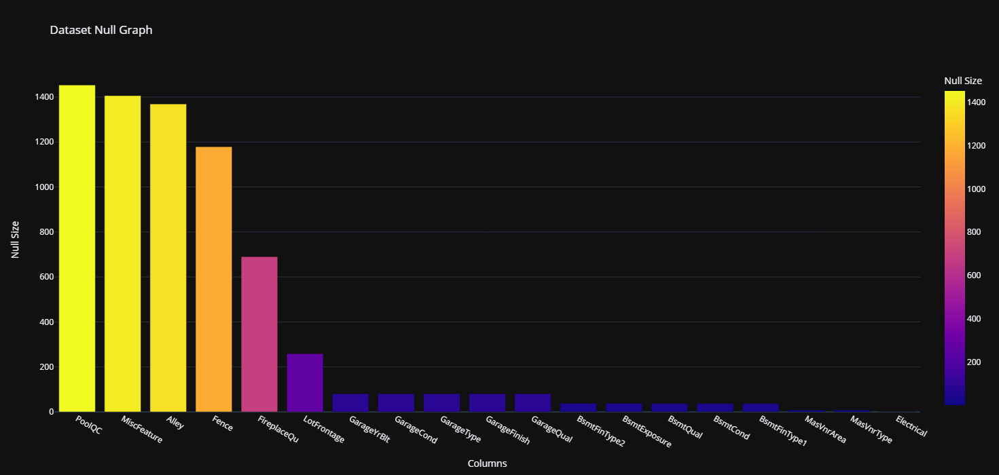

In [13]:
missing_train = missing_control_plot(train)

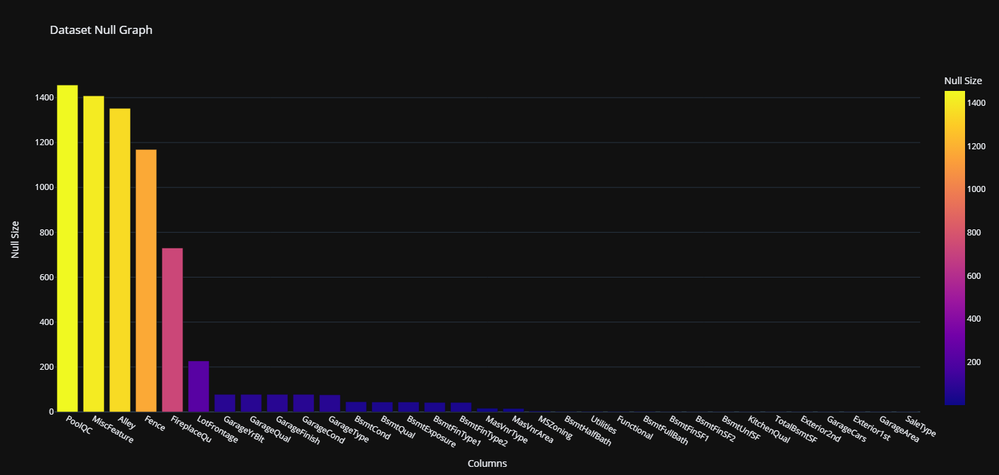

In [14]:
missing_test = missing_control_plot(test)

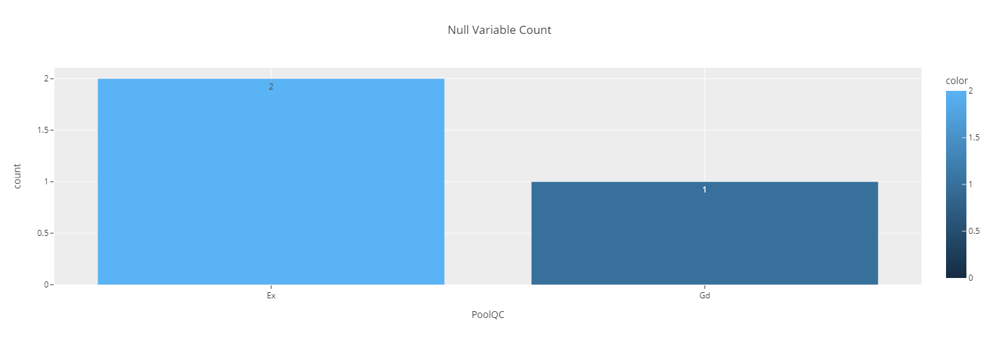

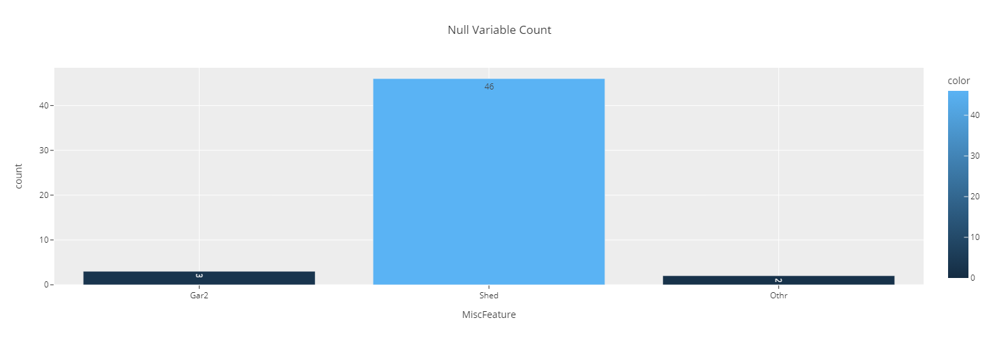

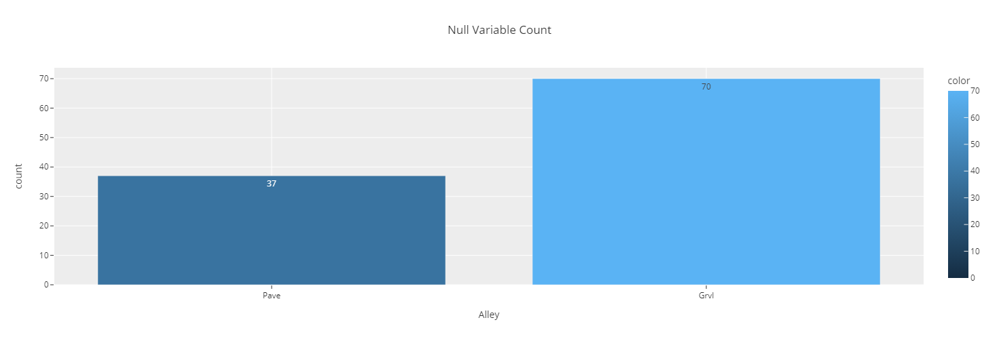

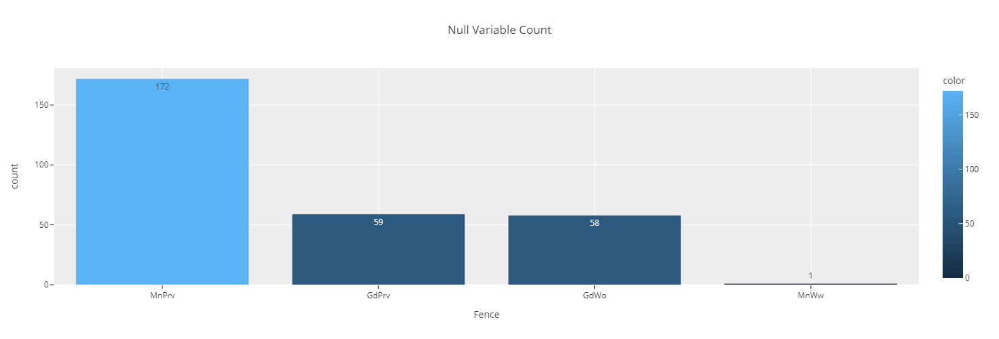

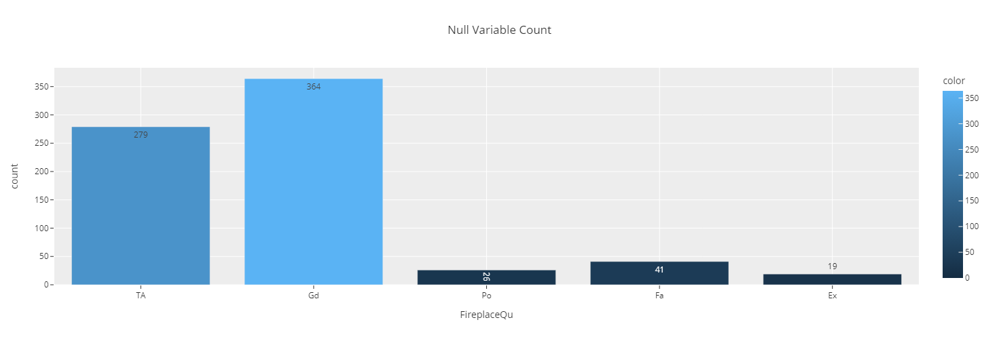

...

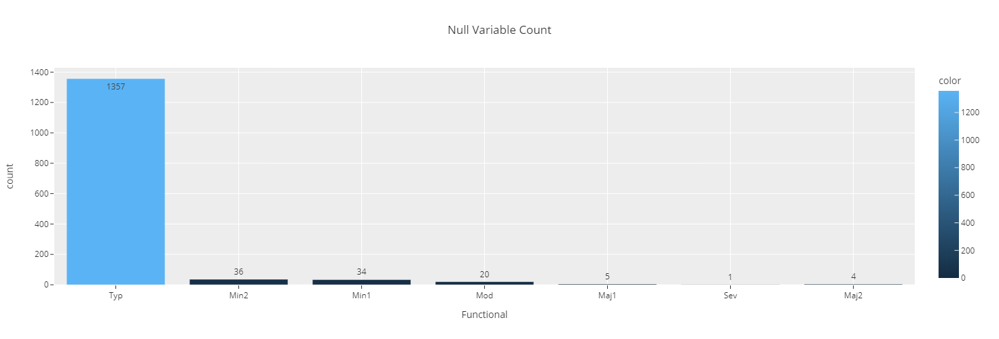

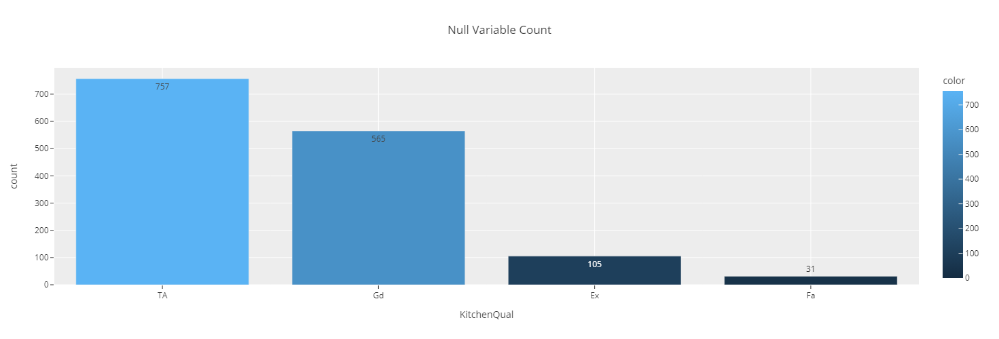

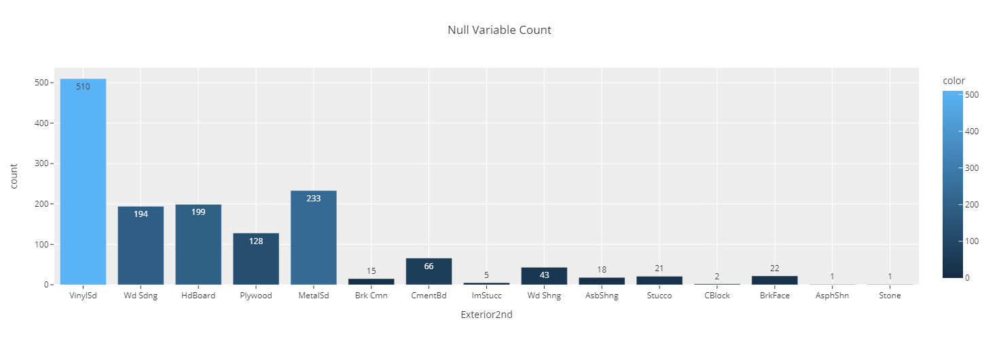

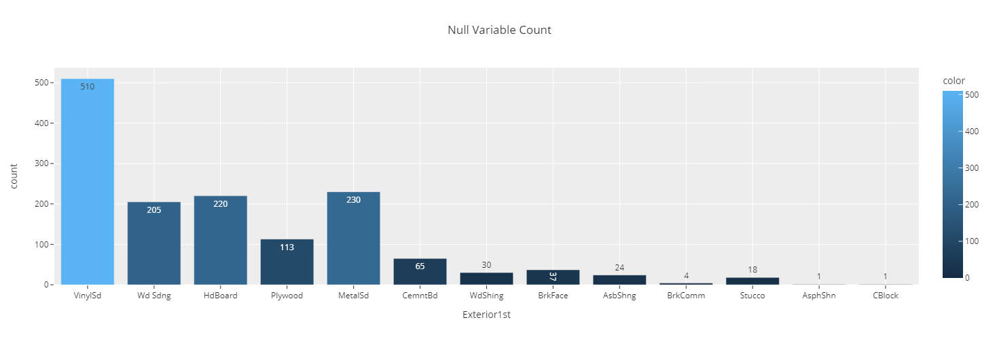

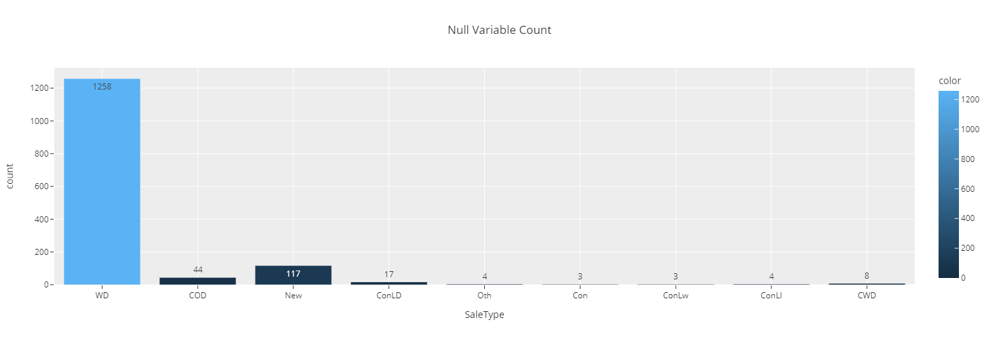

In [15]:
missing_count_plot(test,missing_test,variable_type='cat')

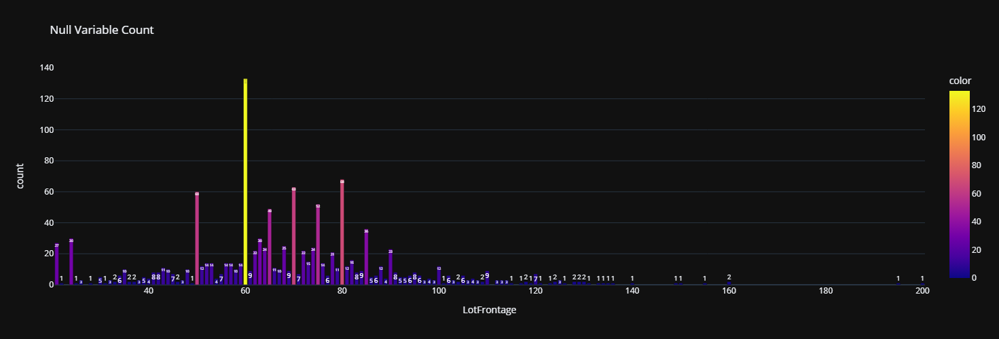

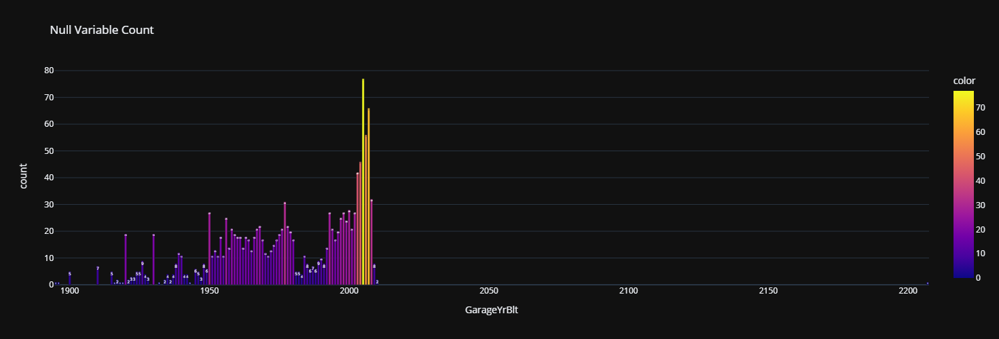

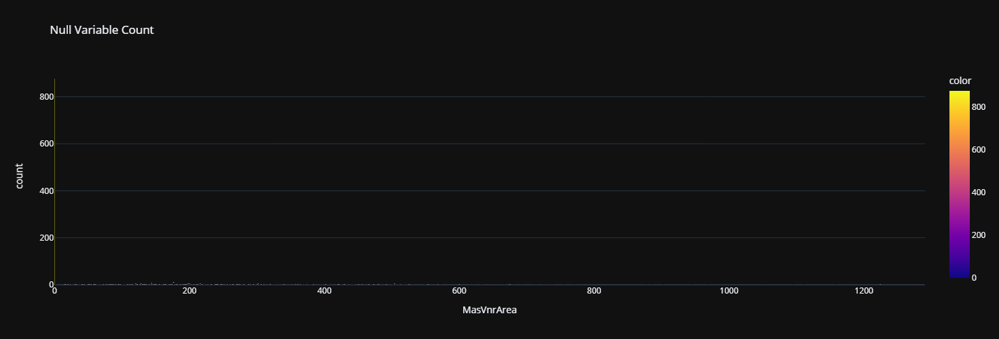

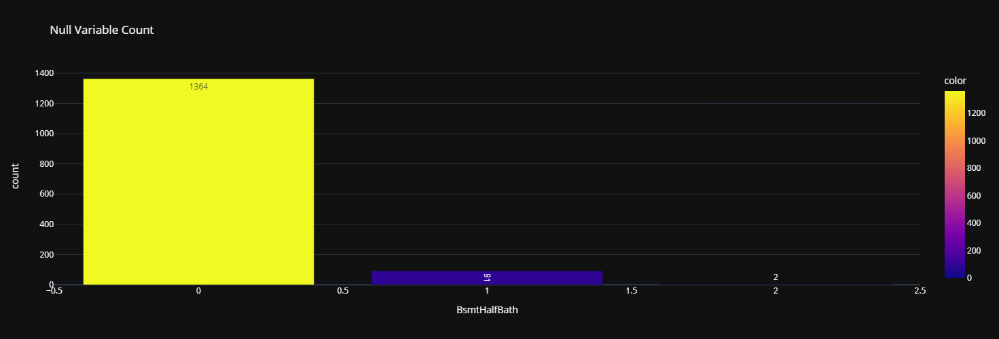

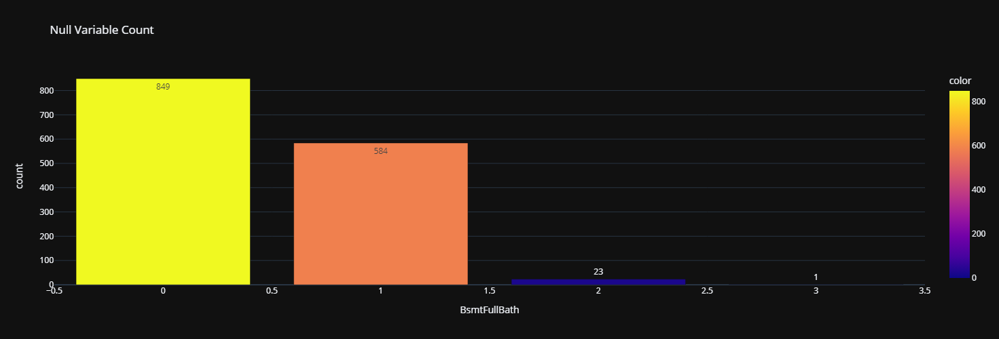

...

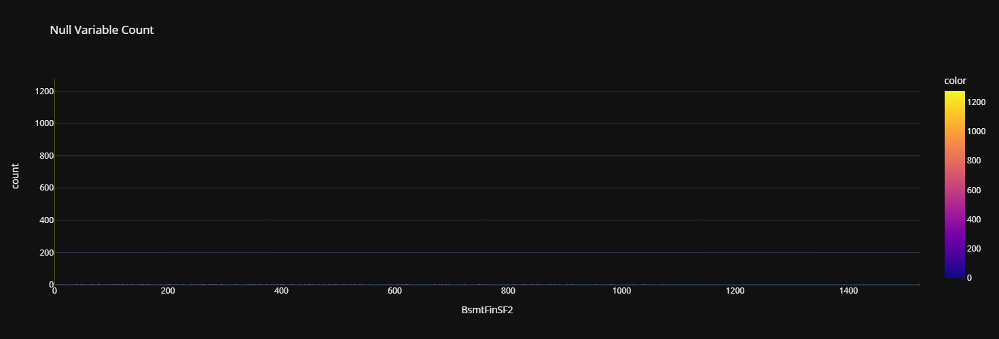

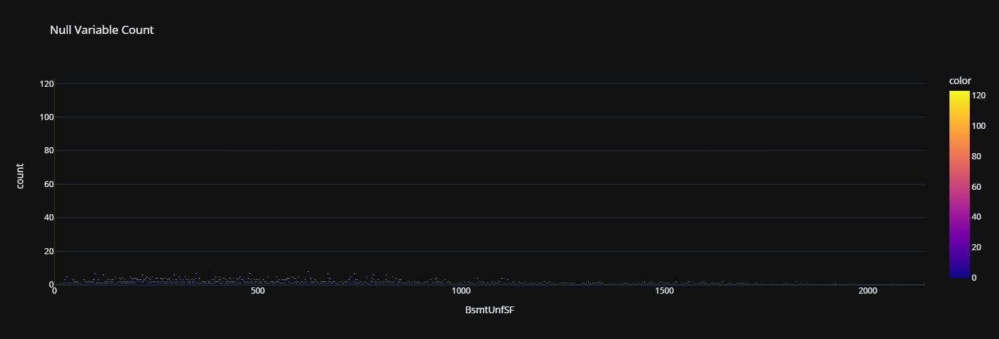

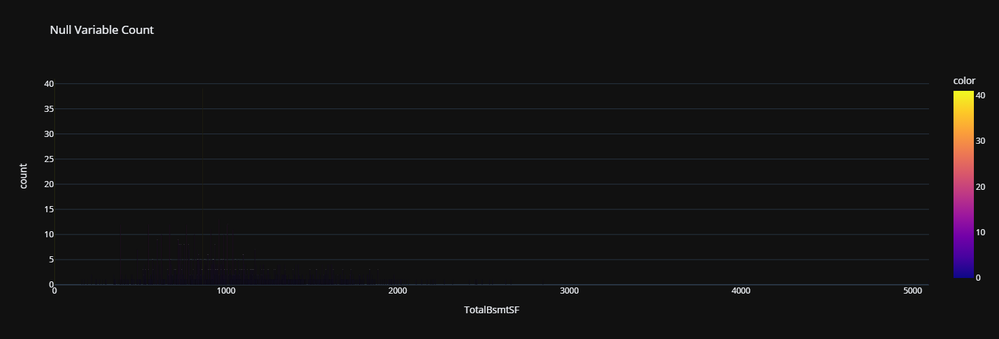

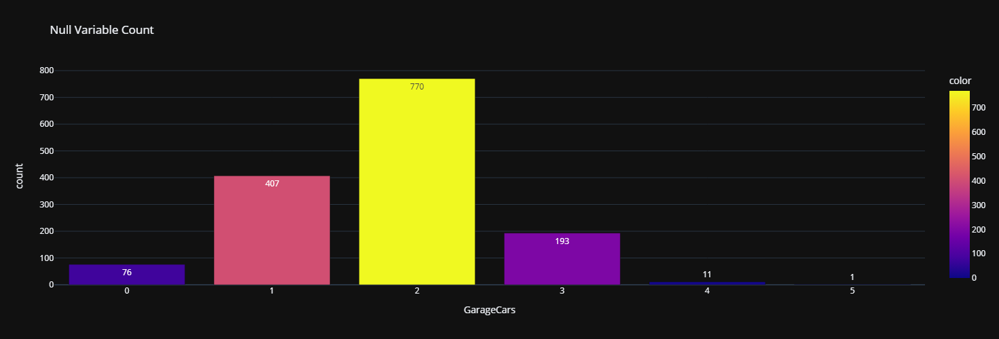

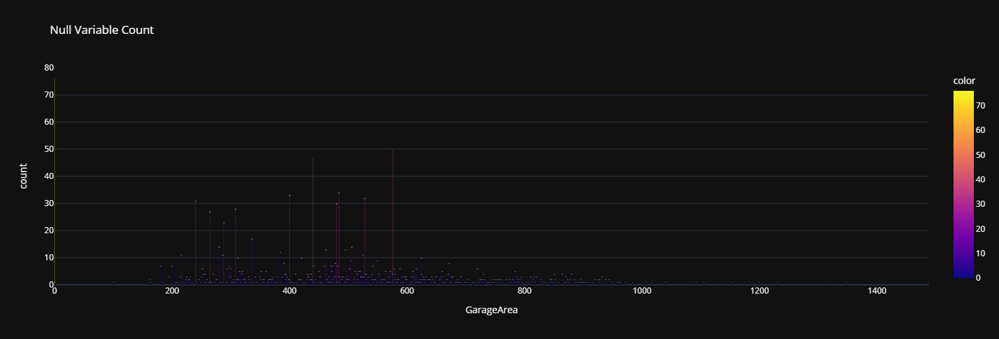

In [16]:
missing_count_plot(test,missing_test,variable_type='num')

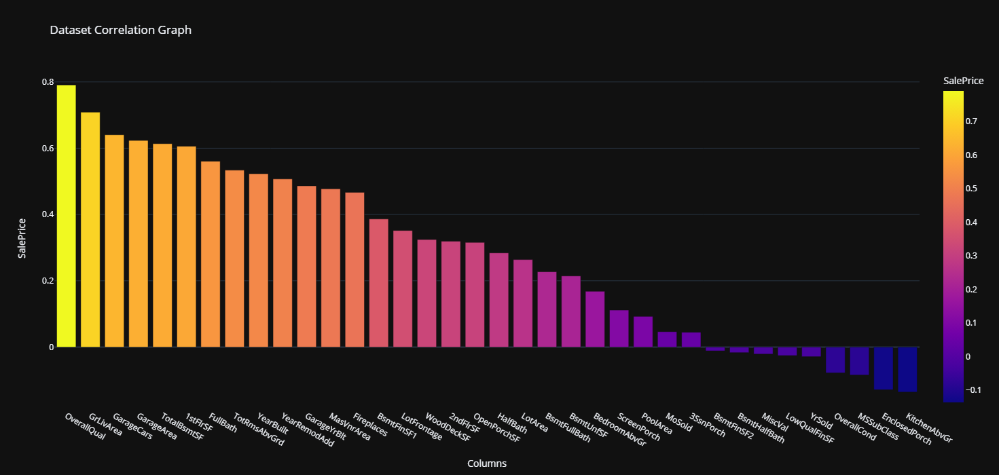

In [17]:
corr_plot(train,target)

In [18]:
missing_value_fill(train)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,GarageRangeBuilt
0,1,60,RL,65.0,8450,Pave,NH,Reg,Lvl,AllPub,...,NH,NF,NH,0,2,2008,WD,Normal,208500,2000-2004
1,2,20,RL,80.0,9600,Pave,NH,Reg,Lvl,AllPub,...,NH,NF,NH,0,5,2007,WD,Normal,181500,1975-1979
2,3,60,RL,68.0,11250,Pave,NH,IR1,Lvl,AllPub,...,NH,NF,NH,0,9,2008,WD,Normal,223500,2000-2004
3,4,70,RL,60.0,9550,Pave,NH,IR1,Lvl,AllPub,...,NH,NF,NH,0,2,2006,WD,Abnorml,140000,1995-1999
4,5,60,RL,84.0,14260,Pave,NH,IR1,Lvl,AllPub,...,NH,NF,NH,0,12,2008,WD,Normal,250000,2000-2004
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1456,60,RL,62.0,7917,Pave,NH,Reg,Lvl,AllPub,...,NH,NF,NH,0,8,2007,WD,Normal,175000,1995-1999
1456,1457,20,RL,85.0,13175,Pave,NH,Reg,Lvl,AllPub,...,NH,MnPrv,NH,0,2,2010,WD,Normal,210000,1975-1979
1457,1458,70,RL,66.0,9042,Pave,NH,Reg,Lvl,AllPub,...,NH,GdPrv,Shed,2500,5,2010,WD,Normal,266500,1940-1949
1458,1459,20,RL,68.0,9717,Pave,NH,Reg,Lvl,AllPub,...,NH,NF,NH,0,4,2010,WD,Normal,142125,1950-1954


In [19]:
train.drop('Id',axis=1,inplace=True)

In [20]:
ordinal_col = ['ExterCond','HeatingQC','ExterQual','KitchenQual','FireplaceQu','GarageQual','GarageCond','BsmtQual','BsmtCond','BsmtExposure','BsmtFinType1','BsmtFinType2','GarageRangeBuilt','OverallQual','OverallCond','KitchenQual','PoolQC']

In [21]:
cat_col = []
for i in train.columns.tolist():
    if len(train[i].unique())<30:
        if i not in ordinal_col:
            cat_col.append(i)

In [22]:
num_cols = [x for x in train.select_dtypes(include=['int','float']).columns.tolist() if x not in ordinal_col and x not in cat_col and x != 'SalePrice']

In [23]:
missing_num_cols = [x for x in train if train[x].isnull().sum() > 0 and x in num_cols]

In [24]:
X_train, X_test, y_train, y_test = train_test_split(train.drop('SalePrice', axis=1),
                                                    train['SalePrice'],
                                                    test_size=0.2,
                                                    random_state=33)
X_train,X_test = pipeline_build(X_train,X_test,missing_num_cols,ordinal_col,cat_col)
xgb_params = {
    'random_state': 33,
    'n_estimators': 1000,
    'max_depth': 8,
    'learning_rate': 0.01,
    'gamma': 0.2,
    'min_child_weight': 4,
    'subsample': 1,
    'colsample_bytree': 1
}

xgb = XGBRegressor(**xgb_params)
xgb.fit(X_train, y_train)

print(f'RMSE : {np.sqrt(mean_squared_error(y_test, xgb.predict(X_test))):.4f}')
print(f'RMSLE : {mean_squared_log_error(y_test, xgb.predict(X_test)):.4f}')
print(f'R2 : {r2_score(y_test, xgb.predict(X_test)):.4f}')

RMSE : 30164.2315
RMSLE : 0.0220
R2 : 0.8530


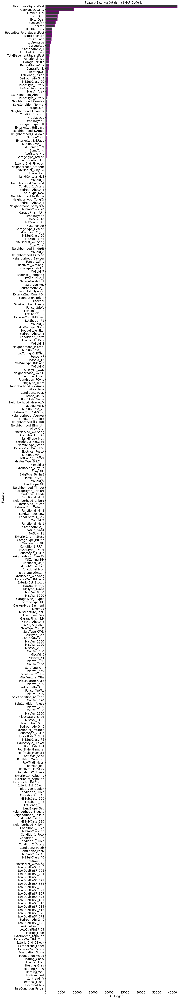

In [25]:
# Shap değerlerinin hesaplanması
explainer = shap.TreeExplainer(xgb)
shap_values = explainer.shap_values(X_test)

# Mutlak içine alınıp ortalama değerlerin bulunması
shap_values_mean_abs = np.abs(shap_values).mean(axis=0)
shap_values_df = pd.DataFrame(shap_values_mean_abs,
                              columns=['importance'],
                              index=X_test.columns)

# büyükten küçüğe sırala
shap_values_df.sort_values('importance', 
                           ascending=False,
                           inplace=True)
plt.figure(figsize=(14, 100))

sns.barplot(x='importance',
            y=shap_values_df.index,
            data=shap_values_df,
            palette="magma", orient='h',
            **{'edgecolor': 'purple', 'linewidth': 3, 'alpha': 0.8})

plt.xlabel('SHAP Değeri', fontsize=16)
plt.ylabel('Feature', fontsize=16)

plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

plt.title('Feature Bazında Ortalama SHAP Değerleri', fontsize=16)
plt.show()

In [26]:
shap_values_df[:61]

,importance
TotalHouseSquareFeet,41472.179688
YearHouseQuality,8844.348633
KitchenQual,4196.595703
BsmtQual,3741.776611
ExterQual,3700.483398
...,...
BedroomAbvGr_4,147.459946
SaleType_New,147.213028
Neighborhood_NoRidge,144.454849
Neighborhood_CollgCr,142.137695


In [27]:
shap_liste = shap_values_df[:61].index.tolist()

In [28]:
X_train_shap_columns = X_train[shap_liste]
X_test_shap_columns = X_test[shap_liste]

In [29]:
from lazypredict.Supervised import LazyRegressor

reg = LazyRegressor(verbose=0,ignore_warnings=False, custom_metric=None )
models,predictions = reg.fit(X_train_shap_columns, X_test_shap_columns, y_train, y_test)

100%|██████████| 42/42 [00:16<00:00,  2.48it/s]

[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000236 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2552
[LightGBM] [Info] Number of data points in the train set: 1168, number of used features: 61
[LightGBM] [Info] Start training from score 180310.786815


In [30]:
models

,Adjusted R-Squared,R-Squared,RMSE,Time Taken
Model,,,,
ExtraTreesRegressor,0.86,0.89,26585.72,1.40
LGBMRegressor,0.85,0.88,27378.71,0.08
GradientBoostingRegressor,0.83,0.87,28417.98,0.53
HistGradientBoostingRegressor,0.83,0.86,29168.30,0.50
XGBRegressor,0.82,0.86,29399.27,0.10
AdaBoostRegressor,0.81,0.85,30244.81,0.19
RandomForestRegressor,0.77,0.82,33424.21,1.80
BaggingRegressor,0.77,0.82,33763.01,0.21
TweedieRegressor,0.66,0.73,40952.51,0.01


In [31]:
import catboost as cb

In [32]:
train_dataset = cb.Pool(X_train_shap_columns, y_train) 
test_dataset = cb.Pool(X_test_shap_columns, y_test)

In [33]:
model = cb.CatBoostRegressor(loss_function="RMSE")

In [34]:
model.fit(train_dataset,verbose = False)

In [35]:
print(f'RMSE : {np.sqrt(mean_squared_error(y_test, model.predict(test_dataset))):.4f}')
print(f'RMSLE : {mean_squared_log_error(y_test, model.predict(test_dataset)):.4f}')
print(f'R2 : {r2_score(y_test, model.predict(test_dataset)):.4f}')

RMSE : 23976.2858
RMSLE : 0.0205
R2 : 0.9071


In [36]:
from sklearn.model_selection import KFold
kf = KFold(n_splits=5, shuffle=True, random_state=33)

In [37]:
shap_liste.append('SalePrice')

In [38]:
def objective(trial,X,y):   
    params = {
        'learning_rate': trial.suggest_float('learning_rate',0.0005, 0.5,step=0.01),
        'n_estimators': trial.suggest_int('n_estimators',0, 3000,step=10),
        'max_bin': trial.suggest_int('max_bin',16, 2048,step=16),
        'subsample': trial.suggest_float('subsample', 0.1, 1,step=0.1),
        'colsample_bylevel': trial.suggest_float('colsample_bylevel', 0.1, 1, step=0.1),
        'loss_function' : 'RMSE',
        'max_depth': trial.suggest_int('max_depth', 6, 10),
        'random_seed': 33,
        'verbose': False
    }
    liste = []  
    for fold_no, (train_index, test_index) in enumerate(kf.split(X,y)):
        print(fold_no)
        # Train ve validasyon setlerini alıyoruz.
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]
        model = cb.CatBoostRegressor(**params)
        model.fit(X_train, y_train)
        print(f'RMSE : {np.sqrt(mean_squared_error(y_test, model.predict(X_test))):.4f}')
        liste.append(np.sqrt(mean_squared_error(y_test, model.predict(X_test))))
    return np.mean(liste)

In [39]:
study = optuna.create_study(direction = 'minimize')
study.optimize(lambda trial: objective(trial, X_train_shap_columns, y_train), n_trials = 100)

[I 2023-09-13 16:06:38,484] A new study created in memory with name: no-name-83c297e8-2ec8-46d1-931c-9ef76d353317


0
RMSE : 33121.8916
1
RMSE : 24278.6460
2
RMSE : 26548.0138
3
RMSE : 39027.0984
4


[I 2023-09-13 16:06:51,366] Trial 0 finished with value: 29996.84394389907 and parameters: {'learning_rate': 0.2105, 'n_estimators': 2040, 'max_bin': 32, 'subsample': 0.5, 'colsample_bylevel': 1.0, 'max_depth': 6}. Best is trial 0 with value: 29996.84394389907.


RMSE : 27008.5700
0
RMSE : 29200.9847
1
RMSE : 24343.3031
2
RMSE : 30324.1063
3
RMSE : 40185.5531
4


[I 2023-09-13 16:07:01,595] Trial 1 finished with value: 30242.879758302435 and parameters: {'learning_rate': 0.2605, 'n_estimators': 1130, 'max_bin': 912, 'subsample': 0.7000000000000001, 'colsample_bylevel': 0.2, 'max_depth': 6}. Best is trial 0 with value: 29996.84394389907.


RMSE : 27160.4517
0
RMSE : 34022.5652
1
RMSE : 26287.1086
2
RMSE : 30907.5662
3
RMSE : 37358.0376
4


[I 2023-09-13 16:12:18,605] Trial 2 finished with value: 31357.609000891243 and parameters: {'learning_rate': 0.0405, 'n_estimators': 1250, 'max_bin': 416, 'subsample': 0.4, 'colsample_bylevel': 1.0, 'max_depth': 10}. Best is trial 0 with value: 29996.84394389907.


RMSE : 28212.7674
0
RMSE : 33716.1471
1
RMSE : 25205.5286
2
RMSE : 30338.2748
3
RMSE : 35778.4992
4


[I 2023-09-13 16:17:31,352] Trial 3 finished with value: 30463.915429515568 and parameters: {'learning_rate': 0.1405, 'n_estimators': 2630, 'max_bin': 1472, 'subsample': 0.4, 'colsample_bylevel': 1.0, 'max_depth': 9}. Best is trial 0 with value: 29996.84394389907.


RMSE : 27281.1274
0
RMSE : 36424.8985
1
RMSE : 27805.3311
2
RMSE : 29860.7790
3
RMSE : 38638.1532
4


[I 2023-09-13 16:35:15,644] Trial 4 finished with value: 32620.354621196 and parameters: {'learning_rate': 0.2505, 'n_estimators': 2440, 'max_bin': 1376, 'subsample': 0.5, 'colsample_bylevel': 0.7000000000000001, 'max_depth': 10}. Best is trial 0 with value: 29996.84394389907.


RMSE : 30372.6113
0
RMSE : 34551.5641
1
RMSE : 29836.3086
2
RMSE : 31888.5407
3
RMSE : 37965.9867
4


[I 2023-09-13 16:35:56,771] Trial 5 finished with value: 33040.781857970156 and parameters: {'learning_rate': 0.47050000000000003, 'n_estimators': 280, 'max_bin': 1632, 'subsample': 0.4, 'colsample_bylevel': 0.30000000000000004, 'max_depth': 9}. Best is trial 0 with value: 29996.84394389907.


RMSE : 30961.5093
0
RMSE : 32887.0877
1
RMSE : 27796.6301
2
RMSE : 31314.3568
3
RMSE : 34467.4086
4


[I 2023-09-13 16:36:36,658] Trial 6 finished with value: 30910.32344340813 and parameters: {'learning_rate': 0.2305, 'n_estimators': 340, 'max_bin': 1744, 'subsample': 0.7000000000000001, 'colsample_bylevel': 1.0, 'max_depth': 9}. Best is trial 0 with value: 29996.84394389907.


RMSE : 28086.1340
0
RMSE : 32188.7062
1
RMSE : 27608.1698
2
RMSE : 32462.9977
3
RMSE : 33470.1655
4


[I 2023-09-13 16:37:03,272] Trial 7 finished with value: 31205.7574264387 and parameters: {'learning_rate': 0.4005, 'n_estimators': 1860, 'max_bin': 672, 'subsample': 0.2, 'colsample_bylevel': 0.2, 'max_depth': 7}. Best is trial 0 with value: 29996.84394389907.


RMSE : 30298.7479
0
RMSE : 31400.7468
1
RMSE : 23852.5843
2
RMSE : 28779.3989
3
RMSE : 35719.1366
4


[I 2023-09-13 16:38:59,049] Trial 8 finished with value: 29359.785712839337 and parameters: {'learning_rate': 0.0305, 'n_estimators': 2930, 'max_bin': 1152, 'subsample': 0.2, 'colsample_bylevel': 1.0, 'max_depth': 8}. Best is trial 8 with value: 29359.785712839337.


RMSE : 27047.0620
0
RMSE : 37704.3535
1
RMSE : 26099.8660
2
RMSE : 31177.9022
3
RMSE : 37405.0723
4


[I 2023-09-13 16:39:32,426] Trial 9 finished with value: 32752.652674041747 and parameters: {'learning_rate': 0.4605, 'n_estimators': 2900, 'max_bin': 1648, 'subsample': 0.8, 'colsample_bylevel': 0.1, 'max_depth': 7}. Best is trial 8 with value: 29359.785712839337.


RMSE : 31376.0694
0
RMSE : 32399.5507
1
RMSE : 25059.8038
2
RMSE : 30423.4358
3
RMSE : 36531.7588
4


[I 2023-09-13 16:40:22,511] Trial 10 finished with value: 30373.12876091774 and parameters: {'learning_rate': 0.0105, 'n_estimators': 840, 'max_bin': 2000, 'subsample': 0.1, 'colsample_bylevel': 0.6, 'max_depth': 8}. Best is trial 8 with value: 29359.785712839337.


RMSE : 27451.0946
0
RMSE : 31535.1657
1
RMSE : 23792.0983
2
RMSE : 26813.3194
3
RMSE : 36541.8793
4


[I 2023-09-13 16:40:33,955] Trial 11 finished with value: 29064.651309973717 and parameters: {'learning_rate': 0.1005, 'n_estimators': 2020, 'max_bin': 32, 'subsample': 1.0, 'colsample_bylevel': 0.8, 'max_depth': 6}. Best is trial 11 with value: 29064.651309973717.


RMSE : 26640.7938
0
RMSE : 30358.8707
1
RMSE : 24679.4264
2
RMSE : 28345.1296
3
RMSE : 37945.4150
4


[I 2023-09-13 16:41:14,141] Trial 12 finished with value: 29659.030558625098 and parameters: {'learning_rate': 0.0905, 'n_estimators': 2060, 'max_bin': 1056, 'subsample': 1.0, 'colsample_bylevel': 0.8, 'max_depth': 7}. Best is trial 11 with value: 29064.651309973717.


RMSE : 26966.3111
0
RMSE : 32976.6146
1
RMSE : 24868.8512
2
RMSE : 28284.3033
3
RMSE : 39819.0791
4


[I 2023-09-13 16:41:59,482] Trial 13 finished with value: 30614.279788246826 and parameters: {'learning_rate': 0.1305, 'n_estimators': 2980, 'max_bin': 112, 'subsample': 1.0, 'colsample_bylevel': 0.8, 'max_depth': 8}. Best is trial 11 with value: 29064.651309973717.


RMSE : 27122.5507
0
RMSE : 51633.6287
1
RMSE : 44230.7736
2
RMSE : 44905.0811
3
RMSE : 50319.4991
4


[I 2023-09-13 16:42:23,461] Trial 14 finished with value: 47045.23191817322 and parameters: {'learning_rate': 0.0005, 'n_estimators': 2410, 'max_bin': 1136, 'subsample': 0.2, 'colsample_bylevel': 0.8, 'max_depth': 6}. Best is trial 11 with value: 29064.651309973717.


RMSE : 44137.1771
0
RMSE : 30949.4636
1
RMSE : 24445.8868
2
RMSE : 28169.9836
3
RMSE : 36288.7866
4


[I 2023-09-13 16:42:49,585] Trial 15 finished with value: 29347.07910680765 and parameters: {'learning_rate': 0.07050000000000001, 'n_estimators': 1740, 'max_bin': 576, 'subsample': 0.8, 'colsample_bylevel': 0.5, 'max_depth': 7}. Best is trial 11 with value: 29064.651309973717.


RMSE : 26881.2749
0
RMSE : 30557.5565
1
RMSE : 27159.2713
2
RMSE : 27239.8872
3
RMSE : 37358.8564
4


[I 2023-09-13 16:43:07,703] Trial 16 finished with value: 29808.11940838258 and parameters: {'learning_rate': 0.1705, 'n_estimators': 1610, 'max_bin': 384, 'subsample': 0.9, 'colsample_bylevel': 0.4, 'max_depth': 7}. Best is trial 11 with value: 29064.651309973717.


RMSE : 26725.0256
0
RMSE : 29481.3772
1
RMSE : 24745.0611
2
RMSE : 27345.4996
3
RMSE : 37230.1006
4


[I 2023-09-13 16:43:20,374] Trial 17 finished with value: 29084.388507872452 and parameters: {'learning_rate': 0.0805, 'n_estimators': 1630, 'max_bin': 416, 'subsample': 0.8, 'colsample_bylevel': 0.5, 'max_depth': 6}. Best is trial 11 with value: 29064.651309973717.


RMSE : 26619.9041
0
RMSE : 32477.2918
1
RMSE : 24665.2691
2
RMSE : 28164.1838
3
RMSE : 41441.3412
4


[I 2023-09-13 16:43:25,454] Trial 18 finished with value: 31663.110955775086 and parameters: {'learning_rate': 0.3405, 'n_estimators': 750, 'max_bin': 256, 'subsample': 0.9, 'colsample_bylevel': 0.6, 'max_depth': 6}. Best is trial 11 with value: 29064.651309973717.


RMSE : 31567.4689
0
RMSE : 32464.5444
1
RMSE : 24893.8546
2
RMSE : 28881.3652
3
RMSE : 40104.3239
4


[I 2023-09-13 16:43:37,832] Trial 19 finished with value: 31376.87467457268 and parameters: {'learning_rate': 0.3005, 'n_estimators': 1270, 'max_bin': 752, 'subsample': 0.7000000000000001, 'colsample_bylevel': 0.5, 'max_depth': 6}. Best is trial 11 with value: 29064.651309973717.


RMSE : 30540.2853
0
RMSE : 28616.0138
1
RMSE : 22772.7191
2
RMSE : 28103.9736
3
RMSE : 35062.9645
4


[I 2023-09-13 16:43:51,475] Trial 20 finished with value: 27912.235380009522 and parameters: {'learning_rate': 0.0905, 'n_estimators': 2250, 'max_bin': 224, 'subsample': 0.9, 'colsample_bylevel': 0.4, 'max_depth': 6}. Best is trial 20 with value: 27912.235380009522.


RMSE : 25005.5059
0
RMSE : 28615.8114
1
RMSE : 22772.4670
2
RMSE : 28104.5547
3
RMSE : 35062.8728
4


[I 2023-09-13 16:44:04,707] Trial 21 finished with value: 27912.085558745854 and parameters: {'learning_rate': 0.0905, 'n_estimators': 2180, 'max_bin': 224, 'subsample': 0.9, 'colsample_bylevel': 0.4, 'max_depth': 6}. Best is trial 21 with value: 27912.085558745854.


RMSE : 25004.7219
0
RMSE : 29138.4055
1
RMSE : 23944.4163
2
RMSE : 27572.2446
3
RMSE : 34323.4096
4


[I 2023-09-13 16:44:17,074] Trial 22 finished with value: 28086.70214072358 and parameters: {'learning_rate': 0.1305, 'n_estimators': 2170, 'max_bin': 176, 'subsample': 1.0, 'colsample_bylevel': 0.4, 'max_depth': 6}. Best is trial 21 with value: 27912.085558745854.


RMSE : 25455.0346
0
RMSE : 30979.5946
1
RMSE : 24536.6780
2
RMSE : 28088.5247
3
RMSE : 37866.9385
4


[I 2023-09-13 16:44:38,273] Trial 23 finished with value: 29612.364609633845 and parameters: {'learning_rate': 0.1705, 'n_estimators': 2270, 'max_bin': 240, 'subsample': 0.9, 'colsample_bylevel': 0.4, 'max_depth': 7}. Best is trial 21 with value: 27912.085558745854.


RMSE : 26590.0872
0
RMSE : 31073.3548
1
RMSE : 23288.2726
2
RMSE : 26818.4143
3
RMSE : 33896.7507
4


[I 2023-09-13 16:44:54,011] Trial 24 finished with value: 28527.96868513517 and parameters: {'learning_rate': 0.1905, 'n_estimators': 2650, 'max_bin': 240, 'subsample': 0.9, 'colsample_bylevel': 0.30000000000000004, 'max_depth': 6}. Best is trial 21 with value: 27912.085558745854.


RMSE : 27563.0510
0
RMSE : 32556.6727
1
RMSE : 25343.0641
2
RMSE : 28620.3567
3
RMSE : 36034.1585
4


[I 2023-09-13 16:45:36,317] Trial 25 finished with value: 29870.243879460148 and parameters: {'learning_rate': 0.1305, 'n_estimators': 2240, 'max_bin': 864, 'subsample': 0.6, 'colsample_bylevel': 0.4, 'max_depth': 7}. Best is trial 21 with value: 27912.085558745854.


RMSE : 26796.9674
0
RMSE : 30344.9457
1
RMSE : 22803.7680
2
RMSE : 28072.4839
3
RMSE : 38666.3017
4


[I 2023-09-13 16:45:57,622] Trial 26 finished with value: 29568.14889287446 and parameters: {'learning_rate': 0.07050000000000001, 'n_estimators': 2640, 'max_bin': 544, 'subsample': 1.0, 'colsample_bylevel': 0.30000000000000004, 'max_depth': 6}. Best is trial 21 with value: 27912.085558745854.


RMSE : 27953.2451
0
RMSE : 29861.5964
1
RMSE : 23829.9224
2
RMSE : 29005.3065
3
RMSE : 32828.6635
4


[I 2023-09-13 16:46:11,450] Trial 27 finished with value: 28580.36583408503 and parameters: {'learning_rate': 0.1205, 'n_estimators': 1410, 'max_bin': 192, 'subsample': 0.8, 'colsample_bylevel': 0.2, 'max_depth': 7}. Best is trial 21 with value: 27912.085558745854.


RMSE : 27376.3403
0
RMSE : 29516.4698
1
RMSE : 23678.9170
2
RMSE : 27046.0085
3
RMSE : 34451.9520
4


[I 2023-09-13 16:46:25,778] Trial 28 finished with value: 28089.76156113737 and parameters: {'learning_rate': 0.0505, 'n_estimators': 1860, 'max_bin': 368, 'subsample': 0.9, 'colsample_bylevel': 0.4, 'max_depth': 6}. Best is trial 21 with value: 27912.085558745854.


RMSE : 25755.4604
0
RMSE : 31099.5683
1
RMSE : 23853.4105
2
RMSE : 28214.7469
3
RMSE : 37781.4846
4


[I 2023-09-13 16:46:36,571] Trial 29 finished with value: 29726.02619957924 and parameters: {'learning_rate': 0.2005, 'n_estimators': 2080, 'max_bin': 64, 'subsample': 0.6, 'colsample_bylevel': 0.1, 'max_depth': 6}. Best is trial 21 with value: 27912.085558745854.


RMSE : 27680.9208
0
RMSE : 31047.5442
1
RMSE : 25104.7355
2
RMSE : 28354.7702
3
RMSE : 38014.0759
4


[I 2023-09-13 16:46:59,780] Trial 30 finished with value: 29655.93874075976 and parameters: {'learning_rate': 0.1705, 'n_estimators': 2430, 'max_bin': 560, 'subsample': 1.0, 'colsample_bylevel': 0.6, 'max_depth': 6}. Best is trial 21 with value: 27912.085558745854.


RMSE : 25758.5679
0
RMSE : 29518.6493
1
RMSE : 23681.3467
2
RMSE : 27044.6876
3
RMSE : 34449.2595
4


[I 2023-09-13 16:47:14,604] Trial 31 finished with value: 28090.842289178923 and parameters: {'learning_rate': 0.0505, 'n_estimators': 1880, 'max_bin': 368, 'subsample': 0.9, 'colsample_bylevel': 0.4, 'max_depth': 6}. Best is trial 21 with value: 27912.085558745854.


RMSE : 25760.2683
0
RMSE : 29983.8494
1
RMSE : 24011.9506
2
RMSE : 27269.0667
3
RMSE : 34496.2741
4


[I 2023-09-13 16:47:27,731] Trial 32 finished with value: 28483.746770505444 and parameters: {'learning_rate': 0.0505, 'n_estimators': 2270, 'max_bin': 144, 'subsample': 0.9, 'colsample_bylevel': 0.30000000000000004, 'max_depth': 6}. Best is trial 21 with value: 27912.085558745854.


RMSE : 26657.5931
0
RMSE : 30054.7075
1
RMSE : 24723.3035
2
RMSE : 26850.3899
3
RMSE : 34421.4568
4


[I 2023-09-13 16:47:38,523] Trial 33 finished with value: 28332.66503015859 and parameters: {'learning_rate': 0.1005, 'n_estimators': 1900, 'max_bin': 16, 'subsample': 0.8, 'colsample_bylevel': 0.4, 'max_depth': 6}. Best is trial 21 with value: 27912.085558745854.


RMSE : 25613.4675
0
RMSE : 31957.2162
1
RMSE : 24897.7494
2
RMSE : 29683.5849
3
RMSE : 36799.5923
4


[I 2023-09-13 16:47:54,250] Trial 34 finished with value: 30096.90032807783 and parameters: {'learning_rate': 0.1505, 'n_estimators': 1420, 'max_bin': 320, 'subsample': 0.7000000000000001, 'colsample_bylevel': 0.5, 'max_depth': 7}. Best is trial 21 with value: 27912.085558745854.


RMSE : 27146.3587
0
RMSE : 28049.7708
1
RMSE : 23891.8087
2
RMSE : 27477.0833
3
RMSE : 34801.7842
4


[I 2023-09-13 16:48:06,359] Trial 35 finished with value: 28149.474922897905 and parameters: {'learning_rate': 0.0305, 'n_estimators': 1710, 'max_bin': 464, 'subsample': 1.0, 'colsample_bylevel': 0.2, 'max_depth': 6}. Best is trial 21 with value: 27912.085558745854.


RMSE : 26526.9276
0
RMSE : 30509.2311
1
RMSE : 27344.7106
2
RMSE : 29660.2289
3
RMSE : 35788.2257
4


[I 2023-09-13 16:48:25,760] Trial 36 finished with value: 30188.426076533255 and parameters: {'learning_rate': 0.2805, 'n_estimators': 2180, 'max_bin': 800, 'subsample': 0.9, 'colsample_bylevel': 0.30000000000000004, 'max_depth': 6}. Best is trial 21 with value: 27912.085558745854.


RMSE : 27639.7340
0
RMSE : 35689.1262
1
RMSE : 27355.1934
2
RMSE : 30761.1215
3
RMSE : 33328.1509
4


[I 2023-09-13 16:59:55,366] Trial 37 finished with value: 31000.324427291962 and parameters: {'learning_rate': 0.1105, 'n_estimators': 2660, 'max_bin': 480, 'subsample': 0.7000000000000001, 'colsample_bylevel': 0.4, 'max_depth': 10}. Best is trial 21 with value: 27912.085558745854.


RMSE : 27868.0302
0
RMSE : 31865.1949
1
RMSE : 25612.6096
2
RMSE : 29174.0652
3
RMSE : 35695.6558
4


[I 2023-09-13 17:00:36,331] Trial 38 finished with value: 30201.39993280932 and parameters: {'learning_rate': 0.2205, 'n_estimators': 1960, 'max_bin': 688, 'subsample': 0.6, 'colsample_bylevel': 0.7000000000000001, 'max_depth': 7}. Best is trial 21 with value: 27912.085558745854.


RMSE : 28659.4742
0
RMSE : 32563.3833
1
RMSE : 26621.2184
2
RMSE : 31702.7638
3
RMSE : 34264.7015
4


[I 2023-09-13 17:02:57,240] Trial 39 finished with value: 30482.476661682704 and parameters: {'learning_rate': 0.0605, 'n_estimators': 2160, 'max_bin': 320, 'subsample': 0.8, 'colsample_bylevel': 0.5, 'max_depth': 9}. Best is trial 21 with value: 27912.085558745854.


RMSE : 27260.3163
0
RMSE : 54572.6088
1
RMSE : 47945.5784
2
RMSE : 48100.1750
3
RMSE : 53483.0123
4


[I 2023-09-13 17:02:57,719] Trial 40 finished with value: 50289.297637885466 and parameters: {'learning_rate': 0.0205, 'n_estimators': 50, 'max_bin': 144, 'subsample': 0.5, 'colsample_bylevel': 0.30000000000000004, 'max_depth': 6}. Best is trial 21 with value: 27912.085558745854.


RMSE : 47345.1137
0
RMSE : 28222.3625
1
RMSE : 23664.2293
2
RMSE : 27086.5181
3
RMSE : 35667.4448
4


[I 2023-09-13 17:03:10,598] Trial 41 finished with value: 27989.65802710999 and parameters: {'learning_rate': 0.0505, 'n_estimators': 1770, 'max_bin': 336, 'subsample': 0.9, 'colsample_bylevel': 0.4, 'max_depth': 6}. Best is trial 21 with value: 27912.085558745854.


RMSE : 25307.7355
0
RMSE : 57139.8874
1
RMSE : 49657.9170
2
RMSE : 49847.4211
3
RMSE : 55788.9935
4


[I 2023-09-13 17:03:22,970] Trial 42 finished with value: 52392.08650549647 and parameters: {'learning_rate': 0.0005, 'n_estimators': 1780, 'max_bin': 288, 'subsample': 0.9, 'colsample_bylevel': 0.4, 'max_depth': 6}. Best is trial 21 with value: 27912.085558745854.


RMSE : 49526.2134
0
RMSE : 30392.4164
1
RMSE : 23661.3961
2
RMSE : 26617.4861
3
RMSE : 36967.0983
4


[I 2023-09-13 17:03:44,898] Trial 43 finished with value: 28799.990728649114 and parameters: {'learning_rate': 0.0405, 'n_estimators': 2500, 'max_bin': 1344, 'subsample': 1.0, 'colsample_bylevel': 0.30000000000000004, 'max_depth': 6}. Best is trial 21 with value: 27912.085558745854.


RMSE : 26361.5567
0
RMSE : 29169.4569
1
RMSE : 26109.3545
2
RMSE : 29053.6173
3
RMSE : 33044.8255
4


[I 2023-09-13 17:04:04,667] Trial 44 finished with value: 29234.166747022653 and parameters: {'learning_rate': 0.1505, 'n_estimators': 1500, 'max_bin': 608, 'subsample': 0.8, 'colsample_bylevel': 0.2, 'max_depth': 7}. Best is trial 21 with value: 27912.085558745854.


RMSE : 28793.5797
0
RMSE : 28501.4183
1
RMSE : 24641.5931
2
RMSE : 28157.7517
3
RMSE : 36158.1541
4


[I 2023-09-13 17:04:11,628] Trial 45 finished with value: 28591.061274873162 and parameters: {'learning_rate': 0.0905, 'n_estimators': 1080, 'max_bin': 144, 'subsample': 1.0, 'colsample_bylevel': 0.5, 'max_depth': 6}. Best is trial 21 with value: 27912.085558745854.


RMSE : 25496.3892
0
RMSE : 31840.9356
1
RMSE : 24713.7500
2
RMSE : 29155.7504
3
RMSE : 36696.6926
4


[I 2023-09-13 17:05:40,833] Trial 46 finished with value: 29576.455776688555 and parameters: {'learning_rate': 0.1105, 'n_estimators': 2390, 'max_bin': 480, 'subsample': 0.4, 'colsample_bylevel': 0.6, 'max_depth': 8}. Best is trial 21 with value: 27912.085558745854.


RMSE : 25475.1503
0
RMSE : 31768.8143
1
RMSE : 23908.1475
2
RMSE : 27817.2371
3
RMSE : 36561.9848
4


[I 2023-09-13 17:06:06,267] Trial 47 finished with value: 29339.65024284377 and parameters: {'learning_rate': 0.07050000000000001, 'n_estimators': 2820, 'max_bin': 192, 'subsample': 0.9, 'colsample_bylevel': 0.4, 'max_depth': 7}. Best is trial 21 with value: 27912.085558745854.


RMSE : 26642.0675
0
RMSE : 31193.9555
1
RMSE : 24417.3061
2
RMSE : 27605.2120
3
RMSE : 36815.2492
4


[I 2023-09-13 17:06:17,105] Trial 48 finished with value: 29261.879200685966 and parameters: {'learning_rate': 0.0205, 'n_estimators': 2010, 'max_bin': 16, 'subsample': 1.0, 'colsample_bylevel': 0.5, 'max_depth': 6}. Best is trial 21 with value: 27912.085558745854.


RMSE : 26277.6731
0
RMSE : 28630.9408
1
RMSE : 23612.4028
2
RMSE : 27045.7213
3
RMSE : 36674.7342
4


[I 2023-09-13 17:06:34,656] Trial 49 finished with value: 28399.672570099334 and parameters: {'learning_rate': 0.0505, 'n_estimators': 1790, 'max_bin': 960, 'subsample': 0.8, 'colsample_bylevel': 0.4, 'max_depth': 6}. Best is trial 21 with value: 27912.085558745854.


RMSE : 26034.5637
0
RMSE : 29200.6945
1
RMSE : 23281.1987
2
RMSE : 26867.6952
3
RMSE : 37346.9328
4


[I 2023-09-13 17:06:48,853] Trial 50 finished with value: 28845.093545852527 and parameters: {'learning_rate': 0.0905, 'n_estimators': 1620, 'max_bin': 384, 'subsample': 0.7000000000000001, 'colsample_bylevel': 0.7000000000000001, 'max_depth': 6}. Best is trial 21 with value: 27912.085558745854.


RMSE : 27528.9466
0
RMSE : 28956.7426
1
RMSE : 24244.1873
2
RMSE : 27239.9189
3
RMSE : 36607.8880
4


[I 2023-09-13 17:07:02,594] Trial 51 finished with value: 28495.580905163195 and parameters: {'learning_rate': 0.0505, 'n_estimators': 1870, 'max_bin': 352, 'subsample': 0.9, 'colsample_bylevel': 0.4, 'max_depth': 6}. Best is trial 21 with value: 27912.085558745854.


RMSE : 25429.1677
0
RMSE : 29408.5676
1
RMSE : 23836.7801
2
RMSE : 26878.1816
3
RMSE : 35494.9532
4


[I 2023-09-13 17:07:18,679] Trial 52 finished with value: 28407.657595663943 and parameters: {'learning_rate': 0.0305, 'n_estimators': 2120, 'max_bin': 432, 'subsample': 0.9, 'colsample_bylevel': 0.30000000000000004, 'max_depth': 6}. Best is trial 21 with value: 27912.085558745854.


RMSE : 26419.8055
0
RMSE : 30259.5031
1
RMSE : 23985.7429
2
RMSE : 27483.5361
3
RMSE : 37469.3783
4


[I 2023-09-13 17:07:38,598] Trial 53 finished with value: 29002.833966327133 and parameters: {'learning_rate': 0.0805, 'n_estimators': 2320, 'max_bin': 672, 'subsample': 1.0, 'colsample_bylevel': 0.2, 'max_depth': 6}. Best is trial 21 with value: 27912.085558745854.


RMSE : 25816.0094
0
RMSE : 27301.1525
1
RMSE : 27340.9752
2
RMSE : 29097.7016
3
RMSE : 35070.6900
4


[I 2023-09-13 17:07:51,710] Trial 54 finished with value: 29268.621549607673 and parameters: {'learning_rate': 0.4205, 'n_estimators': 1960, 'max_bin': 240, 'subsample': 0.9, 'colsample_bylevel': 0.4, 'max_depth': 6}. Best is trial 21 with value: 27912.085558745854.


RMSE : 27532.5884
0
RMSE : 33186.2654
1
RMSE : 25886.7079
2
RMSE : 29811.4478
3
RMSE : 36445.1001
4


[I 2023-09-13 17:08:47,142] Trial 55 finished with value: 30436.385623706505 and parameters: {'learning_rate': 0.1405, 'n_estimators': 2490, 'max_bin': 2016, 'subsample': 0.30000000000000004, 'colsample_bylevel': 0.5, 'max_depth': 7}. Best is trial 21 with value: 27912.085558745854.


RMSE : 26852.4069
0
RMSE : 32026.6294
1
RMSE : 23956.2948
2
RMSE : 29469.3590
3
RMSE : 33540.5204
4


[I 2023-09-13 17:09:15,343] Trial 56 finished with value: 29047.81927688769 and parameters: {'learning_rate': 0.0105, 'n_estimators': 1820, 'max_bin': 80, 'subsample': 0.8, 'colsample_bylevel': 0.30000000000000004, 'max_depth': 8}. Best is trial 21 with value: 27912.085558745854.


RMSE : 26246.2927
0
RMSE : 30133.7228
1
RMSE : 24839.2059
2
RMSE : 28020.1605
3
RMSE : 37542.4222
4


[I 2023-09-13 17:09:29,847] Trial 57 finished with value: 29358.72009289651 and parameters: {'learning_rate': 0.0605, 'n_estimators': 1650, 'max_bin': 368, 'subsample': 1.0, 'colsample_bylevel': 0.5, 'max_depth': 6}. Best is trial 21 with value: 27912.085558745854.


RMSE : 26258.0891
0
RMSE : 34787.1141
1
RMSE : 27165.6925
2
RMSE : 32963.0922
3
RMSE : 38139.0391
4


[I 2023-09-13 17:10:48,993] Trial 58 finished with value: 32254.058161772304 and parameters: {'learning_rate': 0.2405, 'n_estimators': 2060, 'max_bin': 208, 'subsample': 0.9, 'colsample_bylevel': 0.4, 'max_depth': 9}. Best is trial 21 with value: 27912.085558745854.


RMSE : 28215.3528
0
RMSE : 29333.8166
1
RMSE : 25905.1793
2
RMSE : 27718.0770
3
RMSE : 34604.9628
4


[I 2023-09-13 17:11:08,923] Trial 59 finished with value: 29049.214576516337 and parameters: {'learning_rate': 0.1205, 'n_estimators': 1920, 'max_bin': 304, 'subsample': 0.8, 'colsample_bylevel': 0.4, 'max_depth': 7}. Best is trial 21 with value: 27912.085558745854.


RMSE : 27684.0372
0
RMSE : 28135.7334
1
RMSE : 24217.5616
2
RMSE : 27675.8273
3
RMSE : 34913.9137
4


[I 2023-09-13 17:11:18,335] Trial 60 finished with value: 28342.05668345975 and parameters: {'learning_rate': 0.0405, 'n_estimators': 1180, 'max_bin': 528, 'subsample': 0.9, 'colsample_bylevel': 0.30000000000000004, 'max_depth': 6}. Best is trial 21 with value: 27912.085558745854.


RMSE : 26767.2475
0
RMSE : 28702.7939
1
RMSE : 23900.8781
2
RMSE : 27103.6027
3
RMSE : 34660.9350
4


[I 2023-09-13 17:11:30,138] Trial 61 finished with value: 28072.695424618218 and parameters: {'learning_rate': 0.0305, 'n_estimators': 1720, 'max_bin': 448, 'subsample': 1.0, 'colsample_bylevel': 0.2, 'max_depth': 6}. Best is trial 21 with value: 27912.085558745854.


RMSE : 25995.2675
0
RMSE : 29908.3258
1
RMSE : 23596.5934
2
RMSE : 26935.2553
3
RMSE : 36867.4352
4


[I 2023-09-13 17:11:42,163] Trial 62 finished with value: 28792.556193125005 and parameters: {'learning_rate': 0.0805, 'n_estimators': 1520, 'max_bin': 1904, 'subsample': 1.0, 'colsample_bylevel': 0.2, 'max_depth': 6}. Best is trial 21 with value: 27912.085558745854.


RMSE : 26655.1712
0
RMSE : 29505.5685
1
RMSE : 23595.3990
2
RMSE : 28156.6814
3
RMSE : 37055.3073
4


[I 2023-09-13 17:11:50,343] Trial 63 finished with value: 28993.35956809755 and parameters: {'learning_rate': 0.0105, 'n_estimators': 1340, 'max_bin': 96, 'subsample': 1.0, 'colsample_bylevel': 0.6, 'max_depth': 6}. Best is trial 21 with value: 27912.085558745854.


RMSE : 26653.8417
0
RMSE : 28237.3640
1
RMSE : 22680.2727
2
RMSE : 27875.8260
3
RMSE : 34637.2553
4


[I 2023-09-13 17:12:07,351] Trial 64 finished with value: 27702.601576930436 and parameters: {'learning_rate': 0.1005, 'n_estimators': 2210, 'max_bin': 416, 'subsample': 0.9, 'colsample_bylevel': 0.4, 'max_depth': 6}. Best is trial 64 with value: 27702.601576930436.


RMSE : 25082.2899
0
RMSE : 31050.7198
1
RMSE : 24064.1580
2
RMSE : 27521.8139
3
RMSE : 34980.7713
4


[I 2023-09-13 17:12:19,205] Trial 65 finished with value: 28698.699202134954 and parameters: {'learning_rate': 0.1005, 'n_estimators': 2180, 'max_bin': 272, 'subsample': 1.0, 'colsample_bylevel': 0.1, 'max_depth': 6}. Best is trial 64 with value: 27702.601576930436.


RMSE : 25876.0330
0
RMSE : 32154.6844
1
RMSE : 25138.1878
2
RMSE : 29548.4849
3
RMSE : 36790.8906
4


[I 2023-09-13 17:12:35,965] Trial 66 finished with value: 30509.873338239246 and parameters: {'learning_rate': 0.1805, 'n_estimators': 2560, 'max_bin': 624, 'subsample': 0.9, 'colsample_bylevel': 0.1, 'max_depth': 6}. Best is trial 64 with value: 27702.601576930436.


RMSE : 28917.1191
0
RMSE : 31737.3269
1
RMSE : 23265.6145
2
RMSE : 27467.9030
3
RMSE : 37835.7090
4


[I 2023-09-13 17:12:53,342] Trial 67 finished with value: 29295.938679331273 and parameters: {'learning_rate': 0.1505, 'n_estimators': 2320, 'max_bin': 496, 'subsample': 0.1, 'colsample_bylevel': 0.30000000000000004, 'max_depth': 6}. Best is trial 64 with value: 27702.601576930436.


RMSE : 26173.1400
0
RMSE : 31863.8102
1
RMSE : 22757.4911
2
RMSE : 29667.6633
3
RMSE : 37916.0510
4


[I 2023-09-13 17:13:10,450] Trial 68 finished with value: 29859.20083501613 and parameters: {'learning_rate': 0.1305, 'n_estimators': 1700, 'max_bin': 176, 'subsample': 0.8, 'colsample_bylevel': 0.5, 'max_depth': 7}. Best is trial 64 with value: 27702.601576930436.


RMSE : 27090.9887
0
RMSE : 30246.7166
1
RMSE : 23378.3601
2
RMSE : 26647.0069
3
RMSE : 37325.7312
4


[I 2023-09-13 17:13:25,155] Trial 69 finished with value: 29033.640594812965 and parameters: {'learning_rate': 0.07050000000000001, 'n_estimators': 2060, 'max_bin': 384, 'subsample': 1.0, 'colsample_bylevel': 0.30000000000000004, 'max_depth': 6}. Best is trial 64 with value: 27702.601576930436.


RMSE : 27570.3882
0
RMSE : 29196.6661
1
RMSE : 24110.4845
2
RMSE : 28455.1886
3
RMSE : 35024.0984
4


[I 2023-09-13 17:13:55,676] Trial 70 finished with value: 28594.16903233173 and parameters: {'learning_rate': 0.1105, 'n_estimators': 2770, 'max_bin': 448, 'subsample': 0.9, 'colsample_bylevel': 0.2, 'max_depth': 7}. Best is trial 64 with value: 27702.601576930436.


RMSE : 26184.4075
0
RMSE : 29155.7666
1
RMSE : 24396.1068
2
RMSE : 27076.7469
3
RMSE : 35168.0551
4


[I 2023-09-13 17:14:10,330] Trial 71 finished with value: 28320.282637044456 and parameters: {'learning_rate': 0.0605, 'n_estimators': 2190, 'max_bin': 288, 'subsample': 0.9, 'colsample_bylevel': 0.4, 'max_depth': 6}. Best is trial 64 with value: 27702.601576930436.


RMSE : 25804.7378
0
RMSE : 30820.9551
1
RMSE : 24757.4892
2
RMSE : 27415.1329
3
RMSE : 35415.7254
4


[I 2023-09-13 17:14:27,581] Trial 72 finished with value: 28946.82910692882 and parameters: {'learning_rate': 0.0405, 'n_estimators': 1950, 'max_bin': 352, 'subsample': 0.9, 'colsample_bylevel': 0.9, 'max_depth': 6}. Best is trial 64 with value: 27702.601576930436.


RMSE : 26324.8429
0
RMSE : 30052.6462
1
RMSE : 22561.1844
2
RMSE : 27502.9657
3
RMSE : 35679.0832
4


[I 2023-09-13 17:14:37,237] Trial 73 finished with value: 28339.830787822553 and parameters: {'learning_rate': 0.0905, 'n_estimators': 1540, 'max_bin': 240, 'subsample': 1.0, 'colsample_bylevel': 0.4, 'max_depth': 6}. Best is trial 64 with value: 27702.601576930436.


RMSE : 25903.2744
0
RMSE : 29252.8632
1
RMSE : 22516.1635
2
RMSE : 26911.9764
3
RMSE : 34887.2513
4


[I 2023-09-13 17:15:00,191] Trial 74 finished with value: 27833.76531718394 and parameters: {'learning_rate': 0.0305, 'n_estimators': 2370, 'max_bin': 736, 'subsample': 0.9, 'colsample_bylevel': 0.4, 'max_depth': 6}. Best is trial 64 with value: 27702.601576930436.


RMSE : 25600.5722
0
RMSE : 28794.4191
1
RMSE : 23387.1961
2
RMSE : 26888.3308
3
RMSE : 36045.3852
4


[I 2023-09-13 17:15:21,898] Trial 75 finished with value: 28131.479738355345 and parameters: {'learning_rate': 0.0205, 'n_estimators': 2290, 'max_bin': 800, 'subsample': 0.9, 'colsample_bylevel': 0.4, 'max_depth': 6}. Best is trial 64 with value: 27702.601576930436.


RMSE : 25542.0675
0
RMSE : 31765.5063
1
RMSE : 25082.6854
2
RMSE : 29086.9059
3
RMSE : 38546.7739
4


[I 2023-09-13 17:15:45,505] Trial 76 finished with value: 30652.722621168185 and parameters: {'learning_rate': 0.3405, 'n_estimators': 2390, 'max_bin': 624, 'subsample': 0.8, 'colsample_bylevel': 0.5, 'max_depth': 6}. Best is trial 64 with value: 27702.601576930436.


RMSE : 28781.7416
0
RMSE : 53628.8472
1
RMSE : 46210.4800
2
RMSE : 46836.4828
3
RMSE : 52195.7896
4


[I 2023-09-13 17:16:04,736] Trial 77 finished with value: 48970.12195378277 and parameters: {'learning_rate': 0.0005, 'n_estimators': 2210, 'max_bin': 752, 'subsample': 1.0, 'colsample_bylevel': 0.30000000000000004, 'max_depth': 6}. Best is trial 64 with value: 27702.601576930436.


RMSE : 45979.0102
0
RMSE : 28679.4086
1
RMSE : 23270.3240
2
RMSE : 26724.0463
3
RMSE : 36515.1704
4


[I 2023-09-13 17:16:26,108] Trial 78 finished with value: 28348.443407905183 and parameters: {'learning_rate': 0.0305, 'n_estimators': 2530, 'max_bin': 528, 'subsample': 0.8, 'colsample_bylevel': 0.5, 'max_depth': 6}. Best is trial 64 with value: 27702.601576930436.


RMSE : 26553.2678
0
RMSE : 29159.1743
1
RMSE : 23223.7555
2
RMSE : 28177.0002
3
RMSE : 35384.2708
4


[I 2023-09-13 17:16:45,016] Trial 79 finished with value: 28371.21045439013 and parameters: {'learning_rate': 0.0805, 'n_estimators': 2020, 'max_bin': 1216, 'subsample': 0.9, 'colsample_bylevel': 0.4, 'max_depth': 6}. Best is trial 64 with value: 27702.601576930436.


RMSE : 25911.8515
0
RMSE : 30851.2449
1
RMSE : 24379.0270
2
RMSE : 28124.5262
3
RMSE : 34427.9549
4


[I 2023-09-13 17:17:09,787] Trial 80 finished with value: 28954.67989802445 and parameters: {'learning_rate': 0.0605, 'n_estimators': 2110, 'max_bin': 416, 'subsample': 1.0, 'colsample_bylevel': 0.30000000000000004, 'max_depth': 7}. Best is trial 64 with value: 27702.601576930436.


RMSE : 26990.6464
0
RMSE : 29200.8720
1
RMSE : 22328.0057
2
RMSE : 27085.5454
3
RMSE : 34711.8155
4


[I 2023-09-13 17:17:22,530] Trial 81 finished with value: 27664.788905936875 and parameters: {'learning_rate': 0.0405, 'n_estimators': 1850, 'max_bin': 112, 'subsample': 0.9, 'colsample_bylevel': 0.4, 'max_depth': 6}. Best is trial 81 with value: 27664.788905936875.


RMSE : 24997.7060
0
RMSE : 28502.2955
1
RMSE : 21980.5922
2
RMSE : 27761.9321
3
RMSE : 35236.9580
4


[I 2023-09-13 17:17:33,856] Trial 82 finished with value: 27751.419529330647 and parameters: {'learning_rate': 0.0505, 'n_estimators': 1840, 'max_bin': 112, 'subsample': 0.9, 'colsample_bylevel': 0.4, 'max_depth': 6}. Best is trial 81 with value: 27664.788905936875.


RMSE : 25275.3199
0
RMSE : 29221.4985
1
RMSE : 22355.9849
2
RMSE : 27059.0154
3
RMSE : 34723.3027
4


[I 2023-09-13 17:17:48,386] Trial 83 finished with value: 27674.560605954885 and parameters: {'learning_rate': 0.0405, 'n_estimators': 2350, 'max_bin': 112, 'subsample': 0.9, 'colsample_bylevel': 0.4, 'max_depth': 6}. Best is trial 81 with value: 27664.788905936875.


RMSE : 25013.0014
0
RMSE : 29874.7813
1
RMSE : 22641.4144
2
RMSE : 27097.8745
3
RMSE : 34832.1635
4


[I 2023-09-13 17:18:02,332] Trial 84 finished with value: 27873.357241712114 and parameters: {'learning_rate': 0.0305, 'n_estimators': 2350, 'max_bin': 112, 'subsample': 0.8, 'colsample_bylevel': 0.4, 'max_depth': 6}. Best is trial 81 with value: 27664.788905936875.


RMSE : 24920.5525
0
RMSE : 52041.8008
1
RMSE : 44875.1335
2
RMSE : 45544.1954
3
RMSE : 50639.8098
4


[I 2023-09-13 17:18:15,705] Trial 85 finished with value: 47471.125345889464 and parameters: {'learning_rate': 0.0005, 'n_estimators': 2360, 'max_bin': 64, 'subsample': 0.8, 'colsample_bylevel': 0.4, 'max_depth': 6}. Best is trial 81 with value: 27664.788905936875.


RMSE : 44254.6873
0
RMSE : 28916.7835
1
RMSE : 22659.2521
2
RMSE : 27428.7521
3
RMSE : 35103.8843
4


[I 2023-09-13 17:18:31,450] Trial 86 finished with value: 28106.733569028955 and parameters: {'learning_rate': 0.0205, 'n_estimators': 2690, 'max_bin': 112, 'subsample': 0.9, 'colsample_bylevel': 0.5, 'max_depth': 6}. Best is trial 81 with value: 27664.788905936875.


RMSE : 26424.9958
0
RMSE : 29718.7255
1
RMSE : 22848.1462
2
RMSE : 26615.3565
3
RMSE : 35302.0658
4


[I 2023-09-13 17:18:46,415] Trial 87 finished with value: 27993.53387100498 and parameters: {'learning_rate': 0.0605, 'n_estimators': 2570, 'max_bin': 144, 'subsample': 0.8, 'colsample_bylevel': 0.4, 'max_depth': 6}. Best is trial 81 with value: 27664.788905936875.


RMSE : 25483.3754
0
RMSE : 34908.9789
1
RMSE : 26293.3565
2
RMSE : 31359.9686
3
RMSE : 35362.9206
4


[I 2023-09-13 17:19:40,889] Trial 88 finished with value: 31133.5453897104 and parameters: {'learning_rate': 0.0405, 'n_estimators': 2440, 'max_bin': 16, 'subsample': 0.9, 'colsample_bylevel': 0.5, 'max_depth': 9}. Best is trial 81 with value: 27664.788905936875.


RMSE : 27742.5023
0
RMSE : 36155.2437
1
RMSE : 27152.8642
2
RMSE : 31561.2920
3
RMSE : 34231.4822
4


[I 2023-09-13 17:24:37,257] Trial 89 finished with value: 31412.79719458009 and parameters: {'learning_rate': 0.0805, 'n_estimators': 2460, 'max_bin': 192, 'subsample': 0.7000000000000001, 'colsample_bylevel': 0.4, 'max_depth': 10}. Best is trial 81 with value: 27664.788905936875.


RMSE : 27963.1039
0
RMSE : 30175.1680
1
RMSE : 22758.0225
2
RMSE : 27281.0989
3
RMSE : 32694.2503
4


[I 2023-09-13 17:24:52,839] Trial 90 finished with value: 27891.745358446427 and parameters: {'learning_rate': 0.1005, 'n_estimators': 2310, 'max_bin': 112, 'subsample': 0.8, 'colsample_bylevel': 0.30000000000000004, 'max_depth': 6}. Best is trial 81 with value: 27664.788905936875.


RMSE : 26550.1871
0
RMSE : 31163.4185
1
RMSE : 24437.5139
2
RMSE : 26475.8100
3
RMSE : 34692.2304
4


[I 2023-09-13 17:25:05,440] Trial 91 finished with value: 28739.12949878832 and parameters: {'learning_rate': 0.1005, 'n_estimators': 2340, 'max_bin': 64, 'subsample': 0.8, 'colsample_bylevel': 0.30000000000000004, 'max_depth': 6}. Best is trial 81 with value: 27664.788905936875.


RMSE : 26926.6747
0
RMSE : 29920.5411
1
RMSE : 23096.5388
2
RMSE : 26719.5545
3
RMSE : 34084.1327
4


[I 2023-09-13 17:25:18,603] Trial 92 finished with value: 27804.5746832092 and parameters: {'learning_rate': 0.07050000000000001, 'n_estimators': 2230, 'max_bin': 144, 'subsample': 0.7000000000000001, 'colsample_bylevel': 0.4, 'max_depth': 6}. Best is trial 81 with value: 27664.788905936875.


RMSE : 25202.1064
0
RMSE : 28451.3069
1
RMSE : 21564.8558
2
RMSE : 28207.5340
3
RMSE : 33023.5400
4


[I 2023-09-13 17:25:31,891] Trial 93 finished with value: 27432.8696020891 and parameters: {'learning_rate': 0.1205, 'n_estimators': 2260, 'max_bin': 128, 'subsample': 0.8, 'colsample_bylevel': 0.4, 'max_depth': 6}. Best is trial 93 with value: 27432.8696020891.


RMSE : 25917.1113
0
RMSE : 29965.4224
1
RMSE : 23864.8624
2
RMSE : 27426.2550
3
RMSE : 34785.8118
4


[I 2023-09-13 17:25:44,784] Trial 94 finished with value: 28552.357314269804 and parameters: {'learning_rate': 0.07050000000000001, 'n_estimators': 2230, 'max_bin': 144, 'subsample': 0.7000000000000001, 'colsample_bylevel': 0.30000000000000004, 'max_depth': 6}. Best is trial 93 with value: 27432.8696020891.


RMSE : 26719.4349
0
RMSE : 29455.7271
1
RMSE : 24706.6297
2
RMSE : 29041.8604
3
RMSE : 36927.9173
4


[I 2023-09-13 17:25:57,070] Trial 95 finished with value: 29326.55169935382 and parameters: {'learning_rate': 0.4905, 'n_estimators': 2130, 'max_bin': 96, 'subsample': 0.7000000000000001, 'colsample_bylevel': 0.4, 'max_depth': 6}. Best is trial 93 with value: 27432.8696020891.


RMSE : 26500.6240
0
RMSE : 29287.9464
1
RMSE : 22780.0306
2
RMSE : 27364.9213
3
RMSE : 36426.8398
4


[I 2023-09-13 17:26:09,989] Trial 96 finished with value: 28464.676543483736 and parameters: {'learning_rate': 0.1205, 'n_estimators': 2390, 'max_bin': 64, 'subsample': 0.6, 'colsample_bylevel': 0.4, 'max_depth': 6}. Best is trial 93 with value: 27432.8696020891.


RMSE : 26463.6447
0
RMSE : 29096.2711
1
RMSE : 22712.6322
2
RMSE : 27216.0113
3
RMSE : 35420.5672
4


[I 2023-09-13 17:26:23,465] Trial 97 finished with value: 28131.384154978092 and parameters: {'learning_rate': 0.0105, 'n_estimators': 2270, 'max_bin': 128, 'subsample': 0.8, 'colsample_bylevel': 0.30000000000000004, 'max_depth': 6}. Best is trial 93 with value: 27432.8696020891.


RMSE : 26211.4390
0
RMSE : 29156.0642
1
RMSE : 23412.3418
2
RMSE : 27232.0145
3
RMSE : 35945.9147
4


[I 2023-09-13 17:26:43,046] Trial 98 finished with value: 28474.458563555807 and parameters: {'learning_rate': 0.0305, 'n_estimators': 2570, 'max_bin': 224, 'subsample': 0.8, 'colsample_bylevel': 0.5, 'max_depth': 6}. Best is trial 93 with value: 27432.8696020891.


RMSE : 26625.9576
0
RMSE : 31503.0535
1
RMSE : 23499.3475
2
RMSE : 27775.0896
3
RMSE : 35073.3647
4


[I 2023-09-13 17:26:56,397] Trial 99 finished with value: 28804.466233399427 and parameters: {'learning_rate': 0.1005, 'n_estimators': 2310, 'max_bin': 16, 'subsample': 0.7000000000000001, 'colsample_bylevel': 0.4, 'max_depth': 6}. Best is trial 93 with value: 27432.8696020891.


RMSE : 26171.4759


In [40]:
print('Best Value:', study.best_value)
print('Best Params:', study.best_params)
best_params = study.best_params

Best Value: 27432.8696020891
Best Params: {'learning_rate': 0.1205, 'n_estimators': 2260, 'max_bin': 128, 'subsample': 0.8, 'colsample_bylevel': 0.4, 'max_depth': 6}


In [41]:
X = pd.concat([X_train_shap_columns,X_test_shap_columns])
y = pd.concat([y_train,y_test])

In [42]:
external_test = pd.read_csv("C:/Users/MahmutYAVUZ/Desktop/Software/Python/kaggle/regression/data/preprocessed/cleaned_test.csv")

Fold No :  0
RMSE :  23109.707758750752 RMSLE :  0.01443987217937766 MAE :  16012.437613518125 R2 Score :  0.9086464467816844 Adj. R2 Score :  0.9036079596692818


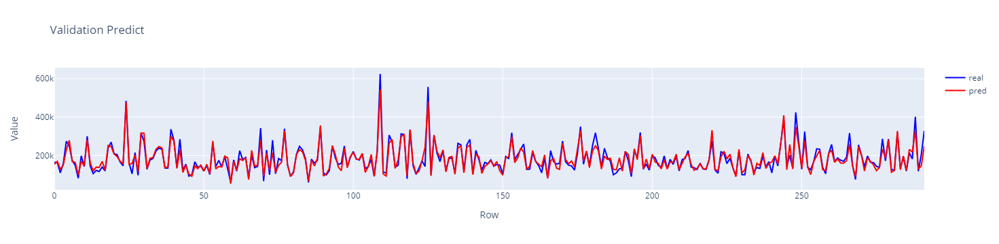

Fold No :  1
RMSE :  25868.692208983222 RMSLE :  0.016120598764498333 MAE :  15388.003088835736 R2 Score :  0.8958761636080035 Adj. R2 Score :  0.890133348038463


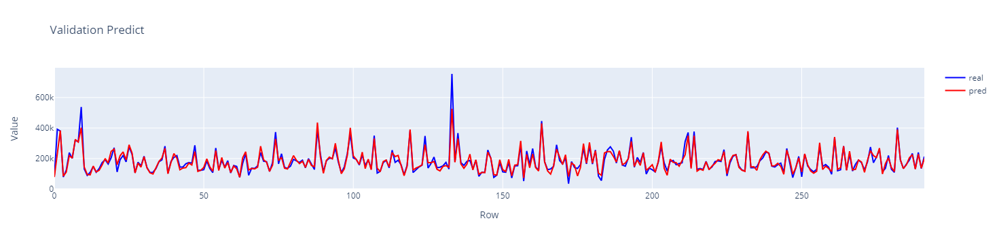

Fold No :  2
RMSE :  22583.485887038205 RMSLE :  0.014943149598945193 MAE :  15089.779361631403 R2 Score :  0.9115296325996182 Adj. R2 Score :  0.9066501638731956


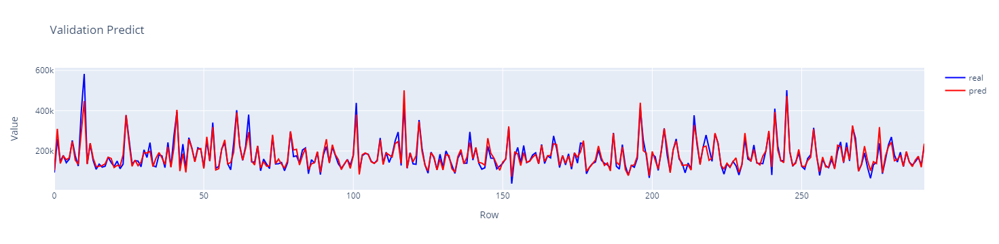

Fold No :  3
RMSE :  40959.39827878635 RMSLE :  0.04876450326429999 MAE :  23297.018284473477 R2 Score :  0.7153501406152303 Adj. R2 Score :  0.6996506456582041


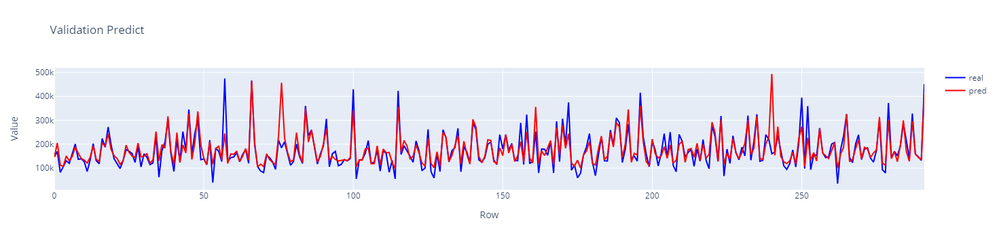

Fold No :  4
RMSE :  32537.150587800323 RMSLE :  0.021923603112378818 MAE :  18819.558908571933 R2 Score :  0.8595513974132623 Adj. R2 Score :  0.8518051363302686


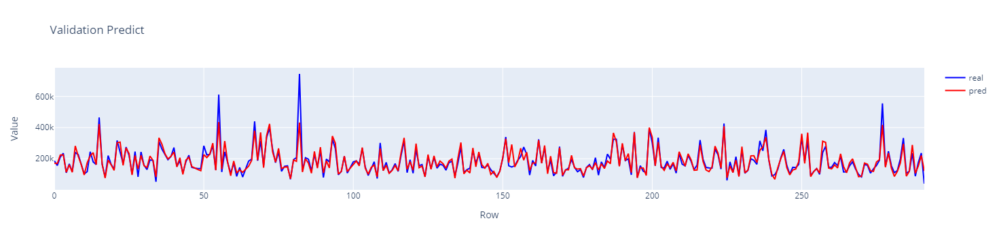

In [43]:
cv_results = []
for fold_no, (train_index, test_index) in enumerate(kf.split(X,y)):
    print("Fold No : ",fold_no)
    # Train ve validasyon setlerini alıyoruz.
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]
    model = cb.CatBoostRegressor(**best_params)
    model.fit(X_train, y_train,
                      eval_set=[(X_train,y_train),(X_test,y_test)],
                      early_stopping_rounds=200,verbose=0)
    y_pred = model.predict(X_test)
    external_test = external_test.reindex(X_test.columns, axis=1)
    external_pred = model.predict(external_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    mae = mean_absolute_error(y_test, y_pred)
    rmsle = mean_squared_log_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)               
    adj_r2 = 1 - (1 - (r2_score(y_test, y_pred))) * (X_train.shape[0] - 1) / (X_train.shape[0] - len(X_train.columns.tolist()) - 1)
    print("RMSE : ", rmse,
         "RMSLE : ",rmsle,
         "MAE : ", mae,
         "R2 Score : ", r2,
         "Adj. R2 Score : ",adj_r2)
    pred=pd.DataFrame(y_pred,columns=['pred'])
    real_and_pred = pd.concat([y_test.reset_index(drop=True),pred],axis=1)
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=real_and_pred.index, y=real_and_pred['SalePrice'], mode='lines', name='real', line=dict(color='blue')))
    fig.add_trace(go.Scatter(x=real_and_pred.index, y=real_and_pred['pred'], mode='lines', name='pred', line=dict(color='red')))
    fig.update_layout(title='Validation Predict', xaxis_title='Row', yaxis_title='Value')
    fig.show()
    cv_results.append({'fold_no': fold_no,
                       'rmse': rmse,
                       'mae': mae,
                       'rmsle': rmsle,
                       'r2': r2,
                       'adj_r2': adj_r2,
                       'real': y_test.tolist(), 'pred': y_pred.tolist(),
                      'external_pred' : external_pred})

In [44]:
best_fold_no = min(cv_results, key=lambda x: x['rmse'])['fold_no']

In [45]:
submission = pd.DataFrame({'Id': test['Id'],
                       'SalePrice': cv_results[best_fold_no]['external_pred'].squeeze()})
submission.to_csv('submission.csv', index=False)
submission.head()

,Id,SalePrice
0,1461,115794.56
1,1462,173047.97
2,1463,195914.57
3,1464,190897.55
4,1465,178166.24


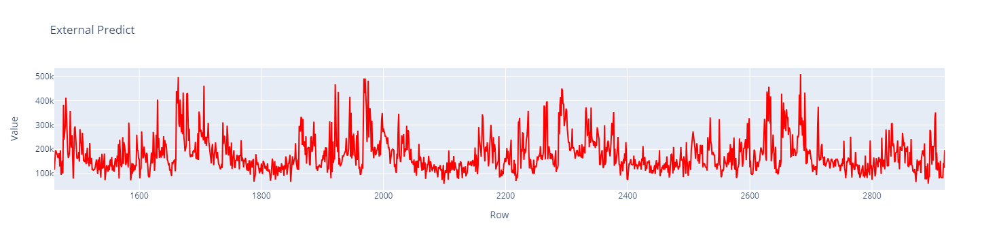

In [46]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=submission['Id'], y=submission['SalePrice'], mode='lines', name='pred', line=dict(color='red')))
fig.update_layout(title='External Predict', xaxis_title='Row', yaxis_title='Value')
fig.show()